In [1]:
import torch
import torch.nn.functional as F
import torch.nn as nn
import torch.optim as optim
import math
from tqdm import tqdm

In [2]:
# Random generators with random seeds
X_train_gen = torch.Generator()   
X_train_gen.manual_seed(1) 
X_test_gen = torch.Generator() 
Noise_gen = torch.Generator()
Noise_gen.manual_seed(2)
Sample_gen = torch.Generator()
Sample_gen.manual_seed(3)

In [3]:
device = "cpu"

In [4]:
def mse(X,Y):
    losses = (X-Y)**2
    return losses.mean()

def single_index(n, d, gen, device="cpu"):
    theta = torch.ones(d)
    theta[1:] = 0
    X =  torch.normal(mean=0, std=1, size=(n,d), device = device, requires_grad=False, generator=gen)
    Y = X @ theta
    return X, Y

def var(X):
    return torch.var(X)
    
def second_moment(X):
    return var(X) + (torch.mean(X)) ** 2

In [5]:
# Parameters
mode = "ntk"
d = 20        # input dimension
m = 1000      # neuron width
n = 200       # number of data

eta_1 = 1e-3   # learning rate for W
eta_2 = 1e-3   # learning rate for a 

label_noise = True  # whether to use label noise
B = 1                # batch size
k_sigma = 4 * d      # label noise scale
k_1 = 1/d * k_sigma  # +- constant
epoch_num = 200001   # number of steps
criterion = mse      # loss function

In [6]:
class TwoLayerNN(nn.Module):
    def __init__(self, d, m, scale="ntk"):
        super(TwoLayerNN, self).__init__()
        W1_gen = torch.Generator()
        W1_gen.manual_seed(99) 
        W2_gen = torch.Generator()
        W2_gen.manual_seed(101)

        # Initialize W (m,d)
        W = torch.randn(m, d, generator=W1_gen) 
        W = W / (d ** 0.5)
        
        self.W = nn.Parameter(W, requires_grad=True)

        # Initialize a~N(0,1) (m,1)
        # a = 2 * torch.randint(0, 2, (m, 1), generator=W2_gen) - 1
        a = torch.randn(m, 1, generator=W2_gen)
        a = a / (m ** 0.5)
          
        self.a = nn.Parameter(a, requires_grad=True)
        self.scale = scale
        self.m = m

    def forward(self, X): #X:(n,d) W:(m,d) a:(m,1)
        output = X @ self.W.T @ self.a # shape: (T, n, m)
        return output

In [7]:
# Generate training and test data
X_GD,Y_GD = single_index(n, d, X_train_gen, device=device)
X_test, Y_test = single_index(n,d,X_test_gen, device=device)
print(X_GD)
print(Y_GD[:10])
print(X_test)
print(Y_test[:10])

tensor([[-1.5256, -0.7502, -0.6540,  ..., -1.1608,  0.6995,  0.1991],
        [ 0.8657,  0.2444, -0.6629,  ...,  0.0457,  0.1530, -0.4757],
        [-0.1110,  0.2927, -0.1578,  ...,  0.9386, -0.1860, -0.6446],
        ...,
        [ 0.6381, -0.3540, -0.5431,  ...,  1.9151, -0.6811,  0.7034],
        [-0.8180, -0.4039, -1.2104,  ..., -1.0875, -0.2432, -0.0727],
        [ 0.0742,  0.5778, -1.0970,  ..., -1.1242,  0.9775,  0.7015]])
tensor([-1.5256,  0.8657, -0.1110,  1.5392, -0.5065,  1.3851,  2.5581,  2.2952,
         0.4175, -0.9640])
tensor([[-0.1737, -1.8225,  0.7792,  ..., -1.9745,  1.5358,  0.5033],
        [ 1.2364, -0.7147,  0.0041,  ..., -0.9549,  0.3995,  0.1250],
        [ 2.0879, -0.2450, -0.2927,  ...,  1.0148, -0.1364,  1.0802],
        ...,
        [-0.6677,  1.2787,  1.1509,  ..., -0.4065,  0.4354, -0.6589],
        [-0.1866, -1.1444, -1.3670,  ...,  0.4300, -2.3673,  0.1478],
        [ 0.5755, -0.4983, -0.9520,  ...,  0.9588, -0.6980, -0.3095]])
tensor([-0.1737,  1.2364,

In [8]:
# Create model
torch.cuda.empty_cache()
model = TwoLayerNN(d, m,scale=mode).to(device)

W1_list = []
W2_list = []

losses = []
total_losses = []
test_losses = []
indexes_large_loss = []

check_num = 248
check_pos = [i * (epoch_num // check_num) for i in range(check_num)]
check_idx = 0

print(check_pos)
print(model.a)

[0, 806, 1612, 2418, 3224, 4030, 4836, 5642, 6448, 7254, 8060, 8866, 9672, 10478, 11284, 12090, 12896, 13702, 14508, 15314, 16120, 16926, 17732, 18538, 19344, 20150, 20956, 21762, 22568, 23374, 24180, 24986, 25792, 26598, 27404, 28210, 29016, 29822, 30628, 31434, 32240, 33046, 33852, 34658, 35464, 36270, 37076, 37882, 38688, 39494, 40300, 41106, 41912, 42718, 43524, 44330, 45136, 45942, 46748, 47554, 48360, 49166, 49972, 50778, 51584, 52390, 53196, 54002, 54808, 55614, 56420, 57226, 58032, 58838, 59644, 60450, 61256, 62062, 62868, 63674, 64480, 65286, 66092, 66898, 67704, 68510, 69316, 70122, 70928, 71734, 72540, 73346, 74152, 74958, 75764, 76570, 77376, 78182, 78988, 79794, 80600, 81406, 82212, 83018, 83824, 84630, 85436, 86242, 87048, 87854, 88660, 89466, 90272, 91078, 91884, 92690, 93496, 94302, 95108, 95914, 96720, 97526, 98332, 99138, 99944, 100750, 101556, 102362, 103168, 103974, 104780, 105586, 106392, 107198, 108004, 108810, 109616, 110422, 111228, 112034, 112840, 113646, 11445

In [9]:
Spec_neuron_check_num = 3
W1_check_pos = [i * 299 for i in range(Spec_neuron_check_num)]
W2_check_pos = [i * 299 for i in range(Spec_neuron_check_num)]

Spec_neuron_check_num += 3
W1_check_pos.append(47)
W1_check_pos.append(62)
W1_check_pos.append(147)
W2_check_pos.append(47)
W2_check_pos.append(62)
W2_check_pos.append(147)

W1_spec_norm = []
W1_spec_cossim = []
W2_check_list = []
W1_W1pre_spec_vari = []
for i in range(Spec_neuron_check_num):
     W1_spec_norm.append([])
     W1_spec_cossim.append([])
     W2_check_list.append([])
     W1_W1pre_spec_vari.append([])

In [10]:
# initial value
W1_list.append(model.W.detach().clone())
W2_list.append(model.a.detach().clone())

In [11]:
# find the hign and low alignment neuron
high_value = 0.6
low_value = 0.01
count_1 = 0
count_2 = 0 
for i in range(m):
     # find the high alignment
     if abs(W1_list[0][i][0].item() / W1_list[0][i].norm().item()) > high_value and count_1 <= 2:
          Spec_neuron_check_num += 1
          count_1 += 1
          W1_check_pos.append(i)
          W2_check_pos.append(i)
          W1_spec_norm.append([])
          W1_spec_cossim.append([])
          W2_check_list.append([])
          W1_W1pre_spec_vari.append([])
          print(i, W1_list[0][i][0].item() / W1_list[0][i].norm().item())

     # find the low alignment
     if abs(W1_list[0][i][0].item() / W1_list[0][i].norm().item()) < low_value and count_2 <= 2:
          count_2 += 1
          Spec_neuron_check_num += 1
          W1_check_pos.append(i)
          W2_check_pos.append(i)
          W1_spec_norm.append([])
          W1_spec_cossim.append([])
          W2_check_list.append([])
          W1_W1pre_spec_vari.append([])
          print(i, W1_list[0][i][0].item() / W1_list[0][i].norm().item())

22 -0.002134498187899788
29 0.6000853499730193
47 0.7044816434854845
53 0.00406994566865859
83 -0.008769859984037584
172 0.6046099551697279


In [12]:
for i in range(Spec_neuron_check_num):
     W1_spec_norm[i].append(W1_list[0][W1_check_pos[i]].norm().item())
     W2_check_list[i].append(W2_list[0][W2_check_pos[i]].norm().item())
     W1_spec_cossim[i].append(W1_list[0][W1_check_pos[i]][0].item() / W1_list[0][W1_check_pos[i]].norm().item())
     W1_W1pre_spec_vari.append(W1_list[0][W1_check_pos[i]].norm().item())
     
check_idx += 1
print(W1_spec_norm)
print(W1_spec_cossim)
print(W2_check_list)

[[1.3369513750076294], [1.0153546333312988], [1.1327077150344849], [1.126628041267395], [1.2238123416900635], [1.1818344593048096], [1.033682107925415], [0.781599760055542], [1.126628041267395], [0.9336130023002625], [0.708724856376648], [0.9275426268577576]]
[[0.050085242869005626], [-0.28774544427344834], [-0.40970612958057284], [0.7044816434854845], [0.4234745056585365], [0.3615535378143072], [-0.002134498187899788], [0.6000853499730193], [0.7044816434854845], [0.00406994566865859], [-0.008769859984037584], [0.6046099551697279]]
[[0.019061025232076645], [0.007555644493550062], [0.01030791737139225], [0.017395110800862312], [0.017063898965716362], [0.012845659628510475], [0.017645273357629776], [0.030422911047935486], [0.017395110800862312], [0.028857743367552757], [0.05297310650348663], [0.02283947914838791]]


In [13]:
W1_norm_means = []
W2_norm_means = []
Cos_sim_abs_means = []
W1_pre = torch.zeros(m).unsqueeze(1)
W2_pre = torch.zeros(m).unsqueeze(1)

In [14]:
optimizer = optim.SGD([{'params': model.W, 'lr': eta_1},{'params': model.a, 'lr': eta_2}])
theta = torch.ones(d)
theta[1:] = 0

next_stage = 200000
X_pre = X_GD[0]
for i in tqdm(range(epoch_num)):
     model.zero_grad()
     with torch.no_grad():
          if check_idx < check_num and check_pos[check_idx] == i:
               W1_temp = model.W.detach().clone()
               W2_temp = model.a.detach().clone()
               W1_list.append(W1_temp)
               W2_list.append(W2_temp)
               check_idx += 1

     indices = torch.randperm(n, generator = Sample_gen)[:B]

     X = X_GD[indices,:]
     Y = Y_GD[indices]
     X_pre = X[0]

     N = 2 * torch.randint(0, 2, (B,1), generator = Noise_gen).squeeze() - 1

     if i % 10000 >= 5000:
          Y_noisy = Y + k_1 * N
     else:
          Y_noisy = Y
     
     output = model(X).squeeze()
     loss = criterion(output,Y_noisy)
     
     Y_tmp = model(X_GD).squeeze()
     Y_tmp_test = model(X_test).squeeze()

     with torch.no_grad():
          losses.append(loss.item())
          total_losses.append(criterion(Y_tmp, Y_GD).item())
          test_losses.append(criterion(Y_tmp_test, Y_test).item())
          if loss.item() > 1:
               indexes_large_loss.append(i)

          W1_temp = model.W.detach().clone()
          W2_temp = model.a.detach().clone()

          # compute the mean
          W1_norms = torch.norm(W1_temp, dim=1)
          mean_norm = W1_norms.mean()
          W1_norm_means.append(mean_norm.item())

          W2_norms = torch.norm(W2_temp, dim=1)
          mean_norm = W2_norms.mean().item() 
          W2_norm_means.append(mean_norm)

          r1 = torch.abs(W1_temp[:, :1] / W1_norms.unsqueeze(1))  # theta = [1,0,0,...,0]
          r1_mean = r1.mean().item()
          Cos_sim_abs_means.append(r1_mean)

          for j in range(Spec_neuron_check_num):
               W2_check_list[j].append(W2_temp[W2_check_pos[j]].item())
               W1_spec_norm[j].append(W1_temp[W1_check_pos[j]].norm().item())
               W1_spec_cossim[j].append(W1_temp[W1_check_pos[j]][0].item() / W1_temp[W1_check_pos[j]].norm().item())
               W1_W1pre_spec_vari[j].append((W1_temp[W2_check_pos[j]] * W1_pre[W2_check_pos[j]]).sum().item())

          W1_pre = W1_temp
          W2_pre = W2_temp
               
     loss.backward()
     optimizer.step()

     if(i % 1000 == 0):
          with torch.no_grad():
               print("loss:",criterion(model(X).squeeze(),Y))
               print("total_loss:",criterion(Y_tmp, Y_GD))
               print("test_loss:",criterion(Y_tmp_test, Y_test))
model.zero_grad()

  0%|          | 50/200001 [00:00<14:04, 236.74it/s]

loss: tensor(0.0419)
total_loss: tensor(1.2010)
test_loss: tensor(1.2349)


  1%|          | 1040/200001 [00:04<13:27, 246.47it/s]

loss: tensor(0.0010)
total_loss: tensor(0.0010)
test_loss: tensor(0.0011)


  1%|          | 2061/200001 [00:09<12:14, 269.66it/s]

loss: tensor(2.2204e-16)
total_loss: tensor(9.8368e-14)
test_loss: tensor(9.1987e-14)


  2%|▏         | 3023/200001 [00:13<17:12, 190.80it/s]

loss: tensor(3.5527e-15)
total_loss: tensor(3.7022e-14)
test_loss: tensor(3.6490e-14)


  2%|▏         | 4042/200001 [00:17<13:14, 246.62it/s]

loss: tensor(1.4211e-14)
total_loss: tensor(4.2401e-14)
test_loss: tensor(3.7389e-14)


  3%|▎         | 5017/200001 [00:21<21:55, 148.21it/s]

loss: tensor(37.4538)
total_loss: tensor(6.3669e-14)
test_loss: tensor(5.8090e-14)


  3%|▎         | 6034/200001 [00:25<12:46, 253.12it/s]

loss: tensor(15.7424)
total_loss: tensor(16.7375)
test_loss: tensor(17.7377)


  4%|▎         | 7048/200001 [00:30<12:08, 264.81it/s]

loss: tensor(0.3125)
total_loss: tensor(22.1501)
test_loss: tensor(19.3624)


  4%|▍         | 7999/200001 [00:34<11:43, 273.06it/s]

loss: tensor(13.0057)
total_loss: tensor(11.5790)
test_loss: tensor(11.7289)


  5%|▍         | 9055/200001 [00:40<11:33, 275.45it/s]

loss: tensor(14.3418)
total_loss: tensor(11.3622)
test_loss: tensor(12.0244)


  5%|▌         | 10028/200001 [00:44<21:38, 146.33it/s]

loss: tensor(0.0632)
total_loss: tensor(8.6807)
test_loss: tensor(8.3938)


  6%|▌         | 11024/200001 [00:49<17:40, 178.12it/s]

loss: tensor(0.)
total_loss: tensor(1.0704e-14)
test_loss: tensor(1.0562e-14)


  6%|▌         | 12034/200001 [00:53<12:25, 252.25it/s]

loss: tensor(0.)
total_loss: tensor(3.2373e-14)
test_loss: tensor(3.6373e-14)


  7%|▋         | 13028/200001 [00:57<10:26, 298.52it/s]

loss: tensor(0.)
total_loss: tensor(1.6316e-14)
test_loss: tensor(1.4082e-14)


  7%|▋         | 13999/200001 [01:01<10:27, 296.25it/s]

loss: tensor(1.4211e-14)
total_loss: tensor(1.2985e-14)
test_loss: tensor(1.1989e-14)


  8%|▊         | 15061/200001 [01:07<10:36, 290.54it/s]

loss: tensor(8.0090)
total_loss: tensor(1.8127e-14)
test_loss: tensor(1.8758e-14)


  8%|▊         | 16062/200001 [01:10<08:23, 365.38it/s]

loss: tensor(16.3769)
total_loss: tensor(6.8623)
test_loss: tensor(7.5622)


  9%|▊         | 17061/200001 [01:13<08:04, 377.29it/s]

loss: tensor(14.7111)
total_loss: tensor(5.8957)
test_loss: tensor(6.2256)


  9%|▉         | 18060/200001 [01:16<07:52, 385.11it/s]

loss: tensor(5.5507)
total_loss: tensor(6.5671)
test_loss: tensor(6.8044)


 10%|▉         | 19042/200001 [01:19<09:25, 319.96it/s]

loss: tensor(2.3063)
total_loss: tensor(5.0131)
test_loss: tensor(5.5674)


 10%|█         | 20042/200001 [01:23<09:35, 312.63it/s]

loss: tensor(0.8192)
total_loss: tensor(4.4450)
test_loss: tensor(4.9822)


 11%|█         | 21046/200001 [01:26<09:07, 326.77it/s]

loss: tensor(1.1141e-11)
total_loss: tensor(2.9966e-11)
test_loss: tensor(2.6349e-11)


 11%|█         | 22011/200001 [01:29<10:09, 291.99it/s]

loss: tensor(3.5527e-15)
total_loss: tensor(1.1915e-14)
test_loss: tensor(1.2179e-14)


 12%|█▏        | 23055/200001 [01:32<09:27, 311.69it/s]

loss: tensor(8.8818e-16)
total_loss: tensor(1.5108e-14)
test_loss: tensor(1.7066e-14)


 12%|█▏        | 24053/200001 [01:35<08:45, 334.97it/s]

loss: tensor(3.5527e-15)
total_loss: tensor(1.1147e-14)
test_loss: tensor(1.0759e-14)


 13%|█▎        | 25013/200001 [01:48<36:01, 80.94it/s]  

loss: tensor(3.4360)
total_loss: tensor(1.3831e-14)
test_loss: tensor(1.1321e-14)


 13%|█▎        | 26003/200001 [02:05<47:10, 61.48it/s]  

loss: tensor(4.3277)
total_loss: tensor(5.9856)
test_loss: tensor(6.0649)


 14%|█▎        | 27015/200001 [02:25<44:09, 65.28it/s]  

loss: tensor(2.6229)
total_loss: tensor(3.6918)
test_loss: tensor(3.8807)


 14%|█▍        | 28026/200001 [02:30<15:43, 182.26it/s] 

loss: tensor(7.0695)
total_loss: tensor(2.4823)
test_loss: tensor(2.5827)


 15%|█▍        | 29039/200001 [02:35<14:22, 198.14it/s]

loss: tensor(9.4689)
total_loss: tensor(4.3664)
test_loss: tensor(5.0625)


 15%|█▌        | 30066/200001 [02:39<09:27, 299.63it/s]

loss: tensor(0.1945)
total_loss: tensor(3.2511)
test_loss: tensor(3.8260)


 16%|█▌        | 31028/200001 [02:43<15:09, 185.80it/s]

loss: tensor(4.7476e-09)
total_loss: tensor(2.3736e-08)
test_loss: tensor(1.7104e-08)


 16%|█▌        | 32041/200001 [02:47<12:23, 225.83it/s]

loss: tensor(3.8983e-14)
total_loss: tensor(4.7418e-14)
test_loss: tensor(4.0539e-14)


 17%|█▋        | 33041/200001 [02:51<10:01, 277.57it/s]

loss: tensor(0.)
total_loss: tensor(1.4889e-14)
test_loss: tensor(1.2363e-14)


 17%|█▋        | 34063/200001 [02:55<08:45, 315.81it/s]

loss: tensor(1.4211e-14)
total_loss: tensor(1.3477e-14)
test_loss: tensor(1.2103e-14)


 18%|█▊        | 35040/200001 [02:58<08:26, 325.92it/s]

loss: tensor(1.3263)
total_loss: tensor(1.0633e-14)
test_loss: tensor(9.3860e-15)


 18%|█▊        | 36053/200001 [03:01<08:54, 306.46it/s]

loss: tensor(4.6646)
total_loss: tensor(2.6823)
test_loss: tensor(3.9873)


 19%|█▊        | 37066/200001 [03:05<08:33, 317.03it/s]

loss: tensor(5.3562)
total_loss: tensor(2.1795)
test_loss: tensor(2.1732)


 19%|█▉        | 38032/200001 [03:09<12:26, 217.01it/s]

loss: tensor(2.8280)
total_loss: tensor(1.6453)
test_loss: tensor(1.4785)


 20%|█▉        | 39039/200001 [03:12<11:21, 236.18it/s]

loss: tensor(8.3306)
total_loss: tensor(3.2774)
test_loss: tensor(4.8794)


 20%|██        | 40045/200001 [03:16<09:39, 275.94it/s]

loss: tensor(0.1914)
total_loss: tensor(2.0890)
test_loss: tensor(2.5176)


 21%|██        | 41066/200001 [03:20<08:50, 299.74it/s]

loss: tensor(7.3939e-08)
total_loss: tensor(6.2246e-07)
test_loss: tensor(4.8758e-07)


 21%|██        | 42032/200001 [03:23<08:40, 303.23it/s]

loss: tensor(1.2028e-10)
total_loss: tensor(1.7935e-11)
test_loss: tensor(1.4373e-11)


 22%|██▏       | 43062/200001 [03:27<08:50, 295.83it/s]

loss: tensor(0.)
total_loss: tensor(1.4542e-14)
test_loss: tensor(1.4223e-14)


 22%|██▏       | 44041/200001 [03:30<08:43, 297.88it/s]

loss: tensor(2.2204e-14)
total_loss: tensor(7.2045e-15)
test_loss: tensor(8.3068e-15)


 23%|██▎       | 45051/200001 [03:34<08:19, 310.08it/s]

loss: tensor(0.7148)
total_loss: tensor(1.0140e-14)
test_loss: tensor(1.1372e-14)


 23%|██▎       | 46018/200001 [03:38<10:50, 236.89it/s]

loss: tensor(0.0396)
total_loss: tensor(1.6107)
test_loss: tensor(1.6900)


 24%|██▎       | 47040/200001 [03:43<12:36, 202.10it/s]

loss: tensor(0.6675)
total_loss: tensor(1.5879)
test_loss: tensor(1.5038)


 24%|██▍       | 48012/200001 [03:47<10:51, 233.21it/s]

loss: tensor(0.0154)
total_loss: tensor(1.0274)
test_loss: tensor(1.4193)


 25%|██▍       | 49065/200001 [03:51<09:16, 271.33it/s]

loss: tensor(0.1274)
total_loss: tensor(1.4075)
test_loss: tensor(1.6656)


 25%|██▌       | 50029/200001 [03:55<10:12, 244.69it/s]

loss: tensor(0.0465)
total_loss: tensor(1.8937)
test_loss: tensor(2.2435)


 26%|██▌       | 51048/200001 [03:58<08:17, 299.37it/s]

loss: tensor(8.4993e-05)
total_loss: tensor(0.0001)
test_loss: tensor(9.6542e-05)


 26%|██▌       | 52015/200001 [04:02<12:37, 195.33it/s]

loss: tensor(1.0893e-08)
total_loss: tensor(2.2978e-08)
test_loss: tensor(1.7608e-08)


 27%|██▋       | 53038/200001 [04:06<08:09, 300.47it/s]

loss: tensor(2.9365e-12)
total_loss: tensor(1.2872e-11)
test_loss: tensor(9.6388e-12)


 27%|██▋       | 54048/200001 [04:10<08:36, 282.74it/s]

loss: tensor(3.1974e-14)
total_loss: tensor(5.5122e-14)
test_loss: tensor(3.9300e-14)


 28%|██▊       | 55045/200001 [04:14<08:27, 285.64it/s]

loss: tensor(0.3144)
total_loss: tensor(1.5041e-14)
test_loss: tensor(1.0836e-14)


 28%|██▊       | 56042/200001 [04:17<07:58, 300.62it/s]

loss: tensor(0.0283)
total_loss: tensor(1.7173)
test_loss: tensor(2.8643)


 29%|██▊       | 57045/200001 [04:21<09:08, 260.84it/s]

loss: tensor(0.2694)
total_loss: tensor(1.1329)
test_loss: tensor(1.6734)


 29%|██▉       | 58058/200001 [04:25<07:40, 308.57it/s]

loss: tensor(3.3309)
total_loss: tensor(1.6808)
test_loss: tensor(2.2044)


 30%|██▉       | 59046/200001 [04:28<07:59, 294.17it/s]

loss: tensor(0.2267)
total_loss: tensor(1.7126)
test_loss: tensor(2.1894)


 30%|██▉       | 60000/200001 [04:32<08:24, 277.53it/s]

loss: tensor(0.0029)
total_loss: tensor(1.3913)
test_loss: tensor(1.8557)


 31%|███       | 61034/200001 [04:35<07:42, 300.48it/s]

loss: tensor(3.9896e-07)
total_loss: tensor(1.9097e-05)
test_loss: tensor(2.0308e-05)


 31%|███       | 62046/200001 [04:39<08:07, 282.82it/s]

loss: tensor(2.0635e-08)
total_loss: tensor(2.4344e-08)
test_loss: tensor(1.8695e-08)


 32%|███▏      | 63036/200001 [04:43<09:04, 251.41it/s]

loss: tensor(5.6403e-11)
total_loss: tensor(8.3504e-11)
test_loss: tensor(5.8502e-11)


 32%|███▏      | 64022/200001 [04:47<09:19, 242.88it/s]

loss: tensor(7.9936e-13)
total_loss: tensor(7.4687e-13)
test_loss: tensor(5.5529e-13)


 33%|███▎      | 65045/200001 [04:53<08:12, 274.09it/s]

loss: tensor(0.4494)
total_loss: tensor(6.2432e-14)
test_loss: tensor(5.2181e-14)


 33%|███▎      | 66000/200001 [04:58<15:16, 146.18it/s]

loss: tensor(0.0883)
total_loss: tensor(0.6852)
test_loss: tensor(0.8095)


 34%|███▎      | 67020/200001 [05:06<13:02, 169.85it/s] 

loss: tensor(0.3630)
total_loss: tensor(1.3925)
test_loss: tensor(1.7867)


 34%|███▍      | 68039/200001 [05:11<08:30, 258.47it/s]

loss: tensor(0.2397)
total_loss: tensor(1.2140)
test_loss: tensor(1.5926)


 35%|███▍      | 69050/200001 [05:15<07:21, 296.52it/s]

loss: tensor(0.2998)
total_loss: tensor(0.5442)
test_loss: tensor(0.6614)


 35%|███▌      | 70033/200001 [05:19<07:53, 274.63it/s]

loss: tensor(0.8016)
total_loss: tensor(1.6474)
test_loss: tensor(1.8547)


 36%|███▌      | 71053/200001 [05:23<07:20, 292.42it/s]

loss: tensor(8.0931e-05)
total_loss: tensor(0.0006)
test_loss: tensor(0.0005)


 36%|███▌      | 72044/200001 [05:28<10:15, 208.06it/s]

loss: tensor(9.9641e-06)
total_loss: tensor(1.1475e-05)
test_loss: tensor(9.9075e-06)


 37%|███▋      | 73047/200001 [05:31<06:52, 307.72it/s]

loss: tensor(6.3689e-08)
total_loss: tensor(2.4841e-07)
test_loss: tensor(1.7068e-07)


 37%|███▋      | 74055/200001 [05:34<06:39, 315.49it/s]

loss: tensor(4.6821e-09)
total_loss: tensor(6.9812e-09)
test_loss: tensor(5.8774e-09)


 38%|███▊      | 75056/200001 [05:38<06:25, 324.48it/s]

loss: tensor(0.1273)
total_loss: tensor(2.7561e-10)
test_loss: tensor(2.0843e-10)


 38%|███▊      | 76039/200001 [05:41<07:45, 266.24it/s]

loss: tensor(0.4526)
total_loss: tensor(0.9555)
test_loss: tensor(1.0418)


 39%|███▊      | 77042/200001 [05:44<07:29, 273.39it/s]

loss: tensor(1.3379)
total_loss: tensor(0.5865)
test_loss: tensor(0.6050)


 39%|███▉      | 78051/200001 [05:47<07:08, 284.68it/s]

loss: tensor(0.5003)
total_loss: tensor(1.3327)
test_loss: tensor(1.5144)


 40%|███▉      | 79029/200001 [05:51<07:41, 262.40it/s]

loss: tensor(2.6570e-05)
total_loss: tensor(0.7379)
test_loss: tensor(0.9842)


 40%|████      | 80047/200001 [05:54<07:18, 273.53it/s]

loss: tensor(0.0008)
total_loss: tensor(0.8079)
test_loss: tensor(1.1529)


 41%|████      | 81036/200001 [05:57<06:44, 294.20it/s]

loss: tensor(5.2847e-06)
total_loss: tensor(0.0020)
test_loss: tensor(0.0017)


 41%|████      | 82044/200001 [06:00<06:39, 295.08it/s]

loss: tensor(7.7322e-06)
total_loss: tensor(6.9201e-05)
test_loss: tensor(5.6954e-05)


 42%|████▏     | 83045/200001 [06:04<06:43, 290.17it/s]

loss: tensor(1.2165e-05)
total_loss: tensor(4.0408e-06)
test_loss: tensor(3.6099e-06)


 42%|████▏     | 84055/200001 [06:08<06:11, 312.44it/s]

loss: tensor(5.3313e-07)
total_loss: tensor(2.1333e-07)
test_loss: tensor(1.6762e-07)


 43%|████▎     | 85049/200001 [06:11<06:04, 315.22it/s]

loss: tensor(0.0552)
total_loss: tensor(1.0604e-08)
test_loss: tensor(8.5714e-09)


 43%|████▎     | 86044/200001 [06:15<06:37, 286.43it/s]

loss: tensor(0.6028)
total_loss: tensor(0.6481)
test_loss: tensor(0.8700)


 44%|████▎     | 87045/200001 [06:18<06:20, 297.04it/s]

loss: tensor(0.0451)
total_loss: tensor(0.6254)
test_loss: tensor(0.6578)


 44%|████▍     | 88043/200001 [06:23<08:07, 229.70it/s]

loss: tensor(2.0037)
total_loss: tensor(0.6630)
test_loss: tensor(0.8086)


 45%|████▍     | 89044/200001 [06:26<05:56, 311.64it/s]

loss: tensor(0.4936)
total_loss: tensor(0.4690)
test_loss: tensor(0.5078)


 45%|████▌     | 90052/200001 [06:29<05:30, 332.45it/s]

loss: tensor(1.5891)
total_loss: tensor(0.5478)
test_loss: tensor(0.5153)


 46%|████▌     | 91044/200001 [06:32<05:32, 327.88it/s]

loss: tensor(3.0818e-05)
total_loss: tensor(0.0027)
test_loss: tensor(0.0020)


 46%|████▌     | 92028/200001 [06:36<07:16, 247.44it/s]

loss: tensor(0.0001)
total_loss: tensor(0.0001)
test_loss: tensor(9.1871e-05)


 47%|████▋     | 93051/200001 [06:39<05:51, 304.03it/s]

loss: tensor(1.8550e-08)
total_loss: tensor(9.8516e-06)
test_loss: tensor(7.4826e-06)


 47%|████▋     | 94028/200001 [06:43<06:45, 261.28it/s]

loss: tensor(4.7510e-07)
total_loss: tensor(8.5667e-07)
test_loss: tensor(6.0271e-07)


 48%|████▊     | 95024/200001 [06:47<06:03, 288.52it/s]

loss: tensor(0.0358)
total_loss: tensor(6.6760e-08)
test_loss: tensor(4.9633e-08)


 48%|████▊     | 96026/200001 [06:51<07:21, 235.63it/s]

loss: tensor(0.0958)
total_loss: tensor(0.4949)
test_loss: tensor(0.5308)


 49%|████▊     | 97031/200001 [06:56<06:05, 281.43it/s]

loss: tensor(0.3974)
total_loss: tensor(0.6070)
test_loss: tensor(0.7751)


 49%|████▉     | 98032/200001 [07:01<06:55, 245.59it/s]

loss: tensor(0.1947)
total_loss: tensor(0.2530)
test_loss: tensor(0.3841)


 50%|████▉     | 99022/200001 [07:05<06:32, 257.36it/s]

loss: tensor(0.1428)
total_loss: tensor(0.7143)
test_loss: tensor(0.9554)


 50%|█████     | 100036/200001 [07:08<05:01, 331.91it/s]

loss: tensor(0.6632)
total_loss: tensor(0.6501)
test_loss: tensor(0.9025)


 51%|█████     | 101066/200001 [07:11<04:48, 343.12it/s]

loss: tensor(0.0011)
total_loss: tensor(0.0054)
test_loss: tensor(0.0052)


 51%|█████     | 102055/200001 [07:15<04:15, 383.51it/s]

loss: tensor(3.7312e-06)
total_loss: tensor(0.0004)
test_loss: tensor(0.0003)


 52%|█████▏    | 103075/200001 [07:18<04:34, 353.03it/s]

loss: tensor(2.0848e-07)
total_loss: tensor(2.8764e-05)
test_loss: tensor(2.1546e-05)


 52%|█████▏    | 103997/200001 [07:21<05:18, 301.07it/s]

loss: tensor(1.3029e-08)
total_loss: tensor(2.1720e-06)
test_loss: tensor(1.5562e-06)


 53%|█████▎    | 105004/200001 [07:25<05:42, 277.31it/s]

loss: tensor(0.0603)
total_loss: tensor(2.7334e-07)
test_loss: tensor(2.1239e-07)


 53%|█████▎    | 106044/200001 [07:29<07:34, 206.78it/s]

loss: tensor(0.2648)
total_loss: tensor(0.3237)
test_loss: tensor(0.3287)


 54%|█████▎    | 107050/200001 [07:33<05:55, 261.26it/s]

loss: tensor(0.7017)
total_loss: tensor(0.5838)
test_loss: tensor(0.5462)


 54%|█████▍    | 108057/200001 [07:36<04:59, 307.37it/s]

loss: tensor(0.2234)
total_loss: tensor(0.5222)
test_loss: tensor(0.5879)


 55%|█████▍    | 109038/200001 [07:40<04:23, 345.05it/s]

loss: tensor(0.0887)
total_loss: tensor(0.2999)
test_loss: tensor(0.3816)


 55%|█████▌    | 110060/200001 [07:43<04:14, 352.92it/s]

loss: tensor(0.0680)
total_loss: tensor(0.4361)
test_loss: tensor(0.4439)


 55%|█████▌    | 110998/200001 [07:47<05:59, 247.46it/s]

loss: tensor(0.0164)
total_loss: tensor(0.0057)
test_loss: tensor(0.0050)


 56%|█████▌    | 112041/200001 [07:50<04:56, 296.46it/s]

loss: tensor(0.0004)
total_loss: tensor(0.0003)
test_loss: tensor(0.0003)


 57%|█████▋    | 113033/200001 [07:53<05:05, 284.99it/s]

loss: tensor(3.1059e-05)
total_loss: tensor(3.0980e-05)
test_loss: tensor(2.5349e-05)


 57%|█████▋    | 114049/200001 [07:57<05:12, 275.01it/s]

loss: tensor(7.7780e-08)
total_loss: tensor(3.4865e-06)
test_loss: tensor(2.6475e-06)


 58%|█████▊    | 115033/200001 [08:00<05:53, 240.27it/s]

loss: tensor(0.0079)
total_loss: tensor(5.3821e-07)
test_loss: tensor(4.2412e-07)


 58%|█████▊    | 116036/200001 [08:04<04:28, 312.59it/s]

loss: tensor(4.8454)
total_loss: tensor(1.1472)
test_loss: tensor(1.0917)


 59%|█████▊    | 117047/200001 [08:07<03:56, 350.09it/s]

loss: tensor(0.0066)
total_loss: tensor(0.8631)
test_loss: tensor(1.0386)


 59%|█████▉    | 118006/200001 [08:11<05:40, 241.02it/s]

loss: tensor(1.5053)
total_loss: tensor(0.2130)
test_loss: tensor(0.2716)


 60%|█████▉    | 119041/200001 [08:15<05:44, 235.25it/s]

loss: tensor(0.0277)
total_loss: tensor(0.3451)
test_loss: tensor(0.3874)


 60%|██████    | 120054/200001 [08:19<04:38, 286.95it/s]

loss: tensor(0.1028)
total_loss: tensor(0.2762)
test_loss: tensor(0.3438)


 61%|██████    | 121055/200001 [08:23<03:57, 332.05it/s]

loss: tensor(0.0025)
total_loss: tensor(0.0056)
test_loss: tensor(0.0064)


 61%|██████    | 121990/200001 [08:27<04:17, 303.15it/s]

loss: tensor(0.0002)
total_loss: tensor(0.0004)
test_loss: tensor(0.0004)


 62%|██████▏   | 123013/200001 [08:31<07:52, 162.84it/s]

loss: tensor(1.6785e-06)
total_loss: tensor(3.3093e-05)
test_loss: tensor(2.8493e-05)


 62%|██████▏   | 124029/200001 [08:36<05:51, 216.42it/s]

loss: tensor(1.5138e-06)
total_loss: tensor(3.2102e-06)
test_loss: tensor(2.6658e-06)


 63%|██████▎   | 125069/200001 [08:41<03:02, 410.51it/s]

loss: tensor(0.0053)
total_loss: tensor(3.3374e-07)
test_loss: tensor(2.7859e-07)


 63%|██████▎   | 126071/200001 [08:43<03:17, 374.72it/s]

loss: tensor(1.0501)
total_loss: tensor(0.3798)
test_loss: tensor(0.4524)


 64%|██████▎   | 127071/200001 [08:45<02:26, 498.50it/s]

loss: tensor(0.0191)
total_loss: tensor(0.7208)
test_loss: tensor(1.0604)


 64%|██████▍   | 128045/200001 [08:47<02:48, 426.05it/s]

loss: tensor(0.4431)
total_loss: tensor(0.2298)
test_loss: tensor(0.2687)


 65%|██████▍   | 129066/200001 [08:49<02:42, 436.92it/s]

loss: tensor(0.9381)
total_loss: tensor(0.5478)
test_loss: tensor(0.6283)


 65%|██████▌   | 130042/200001 [08:52<03:12, 363.00it/s]

loss: tensor(0.0241)
total_loss: tensor(0.2917)
test_loss: tensor(0.2216)


 66%|██████▌   | 131058/200001 [08:54<02:26, 469.10it/s]

loss: tensor(0.0187)
total_loss: tensor(0.0108)
test_loss: tensor(0.0072)


 66%|██████▌   | 132049/200001 [08:57<02:34, 438.63it/s]

loss: tensor(8.9660e-05)
total_loss: tensor(0.0010)
test_loss: tensor(0.0007)


 67%|██████▋   | 133083/200001 [08:59<02:24, 463.92it/s]

loss: tensor(5.0870e-07)
total_loss: tensor(0.0001)
test_loss: tensor(0.0001)


 67%|██████▋   | 134049/200001 [09:01<02:28, 443.08it/s]

loss: tensor(1.1889e-05)
total_loss: tensor(2.1939e-05)
test_loss: tensor(1.8871e-05)


 68%|██████▊   | 135088/200001 [09:04<02:21, 458.89it/s]

loss: tensor(0.0104)
total_loss: tensor(3.9301e-06)
test_loss: tensor(3.2306e-06)


 68%|██████▊   | 136075/200001 [09:06<02:15, 471.18it/s]

loss: tensor(0.0812)
total_loss: tensor(0.2793)
test_loss: tensor(0.3426)


 69%|██████▊   | 137071/200001 [09:08<02:32, 411.88it/s]

loss: tensor(0.8014)
total_loss: tensor(0.3248)
test_loss: tensor(0.4792)


 69%|██████▉   | 138094/200001 [09:11<02:07, 484.22it/s]

loss: tensor(1.1902)
total_loss: tensor(0.5035)
test_loss: tensor(0.5585)


 70%|██████▉   | 139076/200001 [09:13<01:59, 510.77it/s]

loss: tensor(0.6352)
total_loss: tensor(0.2704)
test_loss: tensor(0.3073)


 70%|███████   | 140066/200001 [09:15<02:21, 423.43it/s]

loss: tensor(0.0626)
total_loss: tensor(0.4902)
test_loss: tensor(0.6413)


 71%|███████   | 141017/200001 [09:18<03:41, 266.84it/s]

loss: tensor(0.0520)
total_loss: tensor(0.0120)
test_loss: tensor(0.0122)


 71%|███████   | 142070/200001 [09:20<02:33, 376.46it/s]

loss: tensor(0.0002)
total_loss: tensor(0.0015)
test_loss: tensor(0.0017)


 72%|███████▏  | 143062/200001 [09:23<02:08, 442.83it/s]

loss: tensor(0.0002)
total_loss: tensor(0.0003)
test_loss: tensor(0.0003)


 72%|███████▏  | 144063/200001 [09:25<02:28, 376.91it/s]

loss: tensor(1.4257e-05)
total_loss: tensor(5.3892e-05)
test_loss: tensor(5.2320e-05)


 73%|███████▎  | 145065/200001 [09:28<02:09, 423.94it/s]

loss: tensor(0.0084)
total_loss: tensor(1.0122e-05)
test_loss: tensor(9.9648e-06)


 73%|███████▎  | 146055/200001 [09:30<02:05, 430.55it/s]

loss: tensor(0.0298)
total_loss: tensor(0.1501)
test_loss: tensor(0.1862)


 74%|███████▎  | 147084/200001 [09:33<01:54, 462.85it/s]

loss: tensor(0.1374)
total_loss: tensor(0.2742)
test_loss: tensor(0.2790)


 74%|███████▍  | 148043/200001 [09:35<02:04, 416.45it/s]

loss: tensor(0.0771)
total_loss: tensor(0.3358)
test_loss: tensor(0.4099)


 75%|███████▍  | 149078/200001 [09:37<01:42, 498.51it/s]

loss: tensor(2.6973)
total_loss: tensor(0.7173)
test_loss: tensor(0.6545)


 75%|███████▌  | 150050/200001 [09:39<01:38, 507.58it/s]

loss: tensor(0.0137)
total_loss: tensor(0.1707)
test_loss: tensor(0.1928)


 76%|███████▌  | 151051/200001 [09:42<01:57, 417.27it/s]

loss: tensor(0.0095)
total_loss: tensor(0.0106)
test_loss: tensor(0.0098)


 76%|███████▌  | 152072/200001 [09:44<01:45, 454.34it/s]

loss: tensor(0.0002)
total_loss: tensor(0.0014)
test_loss: tensor(0.0012)


 77%|███████▋  | 153084/200001 [09:47<01:38, 477.19it/s]

loss: tensor(0.0006)
total_loss: tensor(0.0002)
test_loss: tensor(0.0002)


 77%|███████▋  | 154060/200001 [09:49<01:27, 526.39it/s]

loss: tensor(2.9805e-05)
total_loss: tensor(2.9922e-05)
test_loss: tensor(2.7081e-05)


 78%|███████▊  | 155083/200001 [09:51<01:30, 493.75it/s]

loss: tensor(0.0150)
total_loss: tensor(5.1803e-06)
test_loss: tensor(4.7063e-06)


 78%|███████▊  | 156044/200001 [09:52<01:31, 481.86it/s]

loss: tensor(0.0062)
total_loss: tensor(0.1479)
test_loss: tensor(0.2174)


 79%|███████▊  | 157064/200001 [09:55<01:31, 468.85it/s]

loss: tensor(0.1510)
total_loss: tensor(0.2837)
test_loss: tensor(0.3608)


 79%|███████▉  | 158070/200001 [09:57<01:18, 533.54it/s]

loss: tensor(0.0366)
total_loss: tensor(0.2534)
test_loss: tensor(0.2518)


 80%|███████▉  | 159053/200001 [09:59<01:23, 489.29it/s]

loss: tensor(0.0017)
total_loss: tensor(0.1720)
test_loss: tensor(0.1706)


 80%|████████  | 160045/200001 [10:00<01:16, 524.73it/s]

loss: tensor(0.0371)
total_loss: tensor(0.2560)
test_loss: tensor(0.2366)


 81%|████████  | 161093/200001 [10:03<01:18, 495.56it/s]

loss: tensor(0.0014)
total_loss: tensor(0.0107)
test_loss: tensor(0.0115)


 81%|████████  | 162103/200001 [10:04<01:08, 550.81it/s]

loss: tensor(0.0001)
total_loss: tensor(0.0021)
test_loss: tensor(0.0023)


 82%|████████▏ | 163053/200001 [10:06<01:08, 541.09it/s]

loss: tensor(1.9277e-06)
total_loss: tensor(0.0005)
test_loss: tensor(0.0005)


 82%|████████▏ | 164100/200001 [10:08<01:10, 509.66it/s]

loss: tensor(0.0002)
total_loss: tensor(0.0001)
test_loss: tensor(0.0001)


 83%|████████▎ | 165054/200001 [10:10<01:06, 524.51it/s]

loss: tensor(0.0087)
total_loss: tensor(2.9805e-05)
test_loss: tensor(2.9959e-05)


 83%|████████▎ | 166105/200001 [10:12<01:11, 472.92it/s]

loss: tensor(0.0098)
total_loss: tensor(0.1759)
test_loss: tensor(0.2437)


 84%|████████▎ | 167081/200001 [10:15<01:14, 442.98it/s]

loss: tensor(1.3879)
total_loss: tensor(0.1781)
test_loss: tensor(0.1625)


 84%|████████▍ | 168032/200001 [10:18<01:21, 390.75it/s]

loss: tensor(0.1643)
total_loss: tensor(0.0852)
test_loss: tensor(0.0848)


 85%|████████▍ | 169016/200001 [10:21<02:23, 215.78it/s]

loss: tensor(0.4454)
total_loss: tensor(0.1182)
test_loss: tensor(0.1791)


 85%|████████▌ | 170071/200001 [10:25<01:09, 431.56it/s]

loss: tensor(0.0053)
total_loss: tensor(0.0980)
test_loss: tensor(0.1106)


 86%|████████▌ | 171104/200001 [10:27<00:58, 493.08it/s]

loss: tensor(5.1227e-05)
total_loss: tensor(0.0079)
test_loss: tensor(0.0076)


 86%|████████▌ | 172014/200001 [10:29<00:57, 484.29it/s]

loss: tensor(0.0013)
total_loss: tensor(0.0016)
test_loss: tensor(0.0015)


 87%|████████▋ | 173038/200001 [10:33<02:12, 203.22it/s]

loss: tensor(0.0001)
total_loss: tensor(0.0004)
test_loss: tensor(0.0004)


 87%|████████▋ | 174026/200001 [10:36<01:19, 325.28it/s]

loss: tensor(0.0002)
total_loss: tensor(9.4381e-05)
test_loss: tensor(9.0080e-05)


 88%|████████▊ | 175057/200001 [10:39<01:10, 356.13it/s]

loss: tensor(0.0083)
total_loss: tensor(2.3280e-05)
test_loss: tensor(2.2626e-05)


 88%|████████▊ | 176075/200001 [10:42<00:54, 435.12it/s]

loss: tensor(0.0064)
total_loss: tensor(0.2296)
test_loss: tensor(0.2330)


 89%|████████▊ | 177057/200001 [10:45<01:21, 280.14it/s]

loss: tensor(0.0057)
total_loss: tensor(0.1521)
test_loss: tensor(0.1752)


 89%|████████▉ | 178037/200001 [10:48<00:55, 398.59it/s]

loss: tensor(0.0584)
total_loss: tensor(0.1493)
test_loss: tensor(0.1260)


 90%|████████▉ | 179033/200001 [10:51<01:16, 275.36it/s]

loss: tensor(0.0021)
total_loss: tensor(0.1982)
test_loss: tensor(0.1849)


 90%|█████████ | 180023/200001 [10:55<01:14, 266.69it/s]

loss: tensor(0.3797)
total_loss: tensor(0.3948)
test_loss: tensor(0.3616)


 91%|█████████ | 181048/200001 [10:59<01:13, 256.86it/s]

loss: tensor(0.0056)
total_loss: tensor(0.0311)
test_loss: tensor(0.0280)


 91%|█████████ | 182040/200001 [11:05<01:14, 241.61it/s]

loss: tensor(0.0038)
total_loss: tensor(0.0054)
test_loss: tensor(0.0053)


 92%|█████████▏| 183040/200001 [11:09<00:57, 296.27it/s]

loss: tensor(0.0003)
total_loss: tensor(0.0011)
test_loss: tensor(0.0010)


 92%|█████████▏| 184035/200001 [11:12<00:49, 321.99it/s]

loss: tensor(1.4542e-06)
total_loss: tensor(0.0003)
test_loss: tensor(0.0002)


 93%|█████████▎| 185038/200001 [11:15<00:47, 312.42it/s]

loss: tensor(0.0050)
total_loss: tensor(6.5764e-05)
test_loss: tensor(6.6841e-05)


 93%|█████████▎| 186021/200001 [11:19<00:57, 241.24it/s]

loss: tensor(0.1495)
total_loss: tensor(1.0210)
test_loss: tensor(0.8717)


 94%|█████████▎| 187039/200001 [11:26<01:09, 186.09it/s]

loss: tensor(0.5302)
total_loss: tensor(0.4963)
test_loss: tensor(0.4756)


 94%|█████████▍| 188048/200001 [11:30<00:57, 209.63it/s]

loss: tensor(0.0002)
total_loss: tensor(0.1785)
test_loss: tensor(0.1744)


 95%|█████████▍| 189059/200001 [11:33<00:39, 276.00it/s]

loss: tensor(0.4859)
total_loss: tensor(0.2626)
test_loss: tensor(0.3255)


 95%|█████████▌| 190059/200001 [11:38<00:32, 308.02it/s]

loss: tensor(0.0414)
total_loss: tensor(0.1059)
test_loss: tensor(0.1226)


 96%|█████████▌| 191041/200001 [11:42<00:34, 256.72it/s]

loss: tensor(0.0239)
total_loss: tensor(0.0133)
test_loss: tensor(0.0143)


 96%|█████████▌| 192044/200001 [11:46<00:27, 289.28it/s]

loss: tensor(0.0038)
total_loss: tensor(0.0031)
test_loss: tensor(0.0032)


 97%|█████████▋| 193059/200001 [11:49<00:23, 289.53it/s]

loss: tensor(7.6865e-05)
total_loss: tensor(0.0008)
test_loss: tensor(0.0009)


 97%|█████████▋| 194059/200001 [11:52<00:21, 270.85it/s]

loss: tensor(2.5724e-05)
total_loss: tensor(0.0002)
test_loss: tensor(0.0002)


 98%|█████████▊| 195040/200001 [11:56<00:24, 200.76it/s]

loss: tensor(0.0152)
total_loss: tensor(5.8257e-05)
test_loss: tensor(6.9907e-05)


 98%|█████████▊| 196045/200001 [12:00<00:15, 257.78it/s]

loss: tensor(0.5984)
total_loss: tensor(0.5920)
test_loss: tensor(0.6216)


 99%|█████████▊| 197028/200001 [12:03<00:12, 236.97it/s]

loss: tensor(1.7473e-05)
total_loss: tensor(0.1919)
test_loss: tensor(0.1842)


 99%|█████████▉| 198014/200001 [12:07<00:09, 209.53it/s]

loss: tensor(0.0116)
total_loss: tensor(0.1437)
test_loss: tensor(0.1441)


100%|█████████▉| 199035/200001 [12:11<00:03, 273.17it/s]

loss: tensor(0.2252)
total_loss: tensor(0.1724)
test_loss: tensor(0.1908)


100%|██████████| 200001/200001 [12:15<00:00, 272.08it/s]

loss: tensor(0.2329)
total_loss: tensor(0.1004)
test_loss: tensor(0.1016)


In [15]:
# W1 aligment
theta = torch.ones(d)
theta[1:] = 0
W1_norm_list = []
W1_cos_list = []
for num in range(check_num):
     W1_norm = [W1_list[num][i].norm().item() for i in range(m)]
     W1_cos = (W1_list[num] @ theta).detach().numpy() 
     W1_cos = [W1_cos[i] / W1_list[num][i].norm().item() for i in range(m)]
     W1_norm_list.append(W1_norm)
     W1_cos_list.append(W1_cos)

print(len(W1_norm))
print(len(W1_cos))
print(indexes_large_loss)
print(W1_cos_list[0])
print(W1_cos_list[1])

1000
1000
[8, 13, 16, 17, 19, 22, 25, 27, 32, 33, 35, 36, 39, 41, 42, 44, 45, 51, 52, 53, 57, 58, 60, 64, 68, 69, 70, 73, 76, 77, 80, 81, 83, 84, 85, 87, 88, 89, 90, 91, 93, 94, 96, 98, 100, 101, 102, 105, 111, 113, 115, 116, 120, 121, 123, 124, 125, 127, 128, 130, 131, 132, 134, 136, 137, 139, 140, 141, 142, 143, 144, 145, 146, 149, 152, 153, 154, 155, 156, 157, 158, 160, 165, 167, 170, 171, 172, 173, 174, 176, 177, 178, 179, 181, 182, 185, 186, 188, 189, 190, 191, 192, 193, 195, 197, 199, 200, 201, 203, 204, 205, 206, 208, 210, 212, 213, 214, 218, 219, 222, 225, 229, 230, 231, 232, 233, 235, 237, 238, 239, 240, 241, 242, 243, 244, 246, 247, 248, 249, 250, 251, 252, 253, 254, 255, 256, 258, 259, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 272, 273, 274, 275, 277, 278, 280, 281, 283, 284, 285, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 298, 300, 302, 303, 304, 305, 306, 307, 308, 310, 311, 312, 313, 314, 316, 318, 319, 320, 323, 324, 325, 326, 327, 329, 330, 331, 332, 333,

In [16]:
# W2 observe
print(W2_list[3])
for num in range(check_num):
     W2_list[num] = W2_list[num].view(-1).tolist()
     
W2_x = [j for j in range(m)]
print(W2_x)
print(W2_list[1])

tensor([[ 7.0952e-05],
        [-1.1638e-03],
        [ 2.1070e-03],
        [ 5.8529e-04],
        [ 7.9227e-03],
        [-6.7020e-03],
        [-2.7991e-03],
        [ 3.0907e-03],
        [ 1.5308e-03],
        [ 1.7651e-03],
        [ 3.4718e-03],
        [-6.4582e-04],
        [ 1.0449e-03],
        [-1.3029e-03],
        [-4.6115e-03],
        [-7.1997e-04],
        [ 4.4118e-03],
        [-2.6762e-05],
        [ 1.0279e-02],
        [-1.2371e-03],
        [ 1.5374e-03],
        [-1.7153e-03],
        [-4.5404e-04],
        [ 1.8519e-03],
        [ 2.8093e-03],
        [-6.4184e-03],
        [ 2.1871e-03],
        [ 9.4999e-03],
        [ 8.4000e-03],
        [ 1.1194e-02],
        [ 1.0022e-02],
        [-3.4810e-03],
        [-1.1861e-02],
        [ 2.4920e-03],
        [ 1.9520e-03],
        [ 6.8691e-03],
        [ 2.7979e-03],
        [ 3.9488e-03],
        [ 3.1770e-03],
        [-1.6773e-03],
        [-6.0224e-03],
        [-2.6820e-03],
        [-6.6681e-03],
        [-6

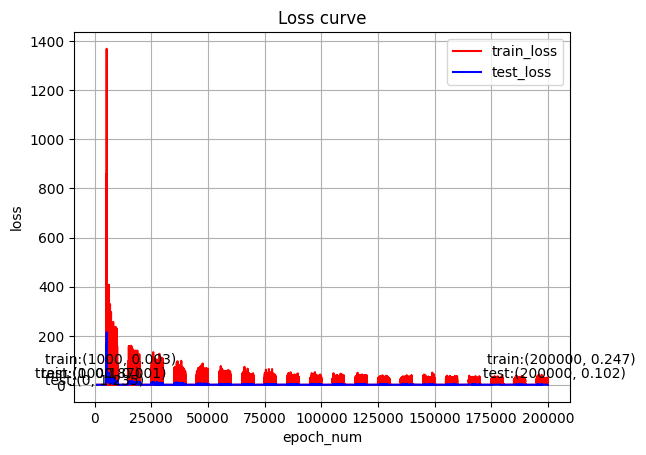

In [17]:
# plot loss
import matplotlib.pyplot as plt
plt.figure()  
start = 1000
end = epoch_num
mid_point = 1000
x = range(0,epoch_num)
plt.plot(x[start:end], losses[start:end], label='train_loss', color='red')
plt.plot(x[start:end], test_losses[start:end], label = 'test_loss', color='blue')
plt.annotate(f'train:({x[0]}, {losses[0]:.3f})',  
                 (x[0], losses[0]),
                 textcoords="offset points",     
                 xytext=(-5, 5),        
                 ha='center') 
plt.annotate(f'test:({x[0]}, {test_losses[0]:.3f})',  
                 (x[0], test_losses[0]),  
                 textcoords="offset points",     
                 xytext=(0,0),      
                 ha='center') 
plt.annotate(f'train:({x[mid_point]}, {losses[mid_point]:.3f})',  
                 (x[mid_point], losses[mid_point]),       
                 textcoords="offset points",     
                 xytext=(10, 15),             
                 ha='center') 
plt.annotate(f'test:({x[mid_point]}, {test_losses[mid_point]:.3f})',  
                 (x[mid_point], test_losses[mid_point]),  
                 textcoords="offset points",     
                 xytext=(5, 5),        
                 ha='center')  
plt.annotate(f'train:({x[epoch_num - 1]}, {losses[epoch_num - 1]:.3f})',  
                 (x[epoch_num - 1], losses[epoch_num - 1]),       
                 textcoords="offset points",     
                 xytext=(10, 15),             
                 ha='center') 
plt.annotate(f'test:({x[epoch_num - 1]}, {test_losses[epoch_num - 1]:.3f})',  
                 (x[epoch_num - 1], test_losses[epoch_num - 1]),  
                 textcoords="offset points",     
                 xytext=(5, 5),        
                 ha='center',)      
plt.title('Loss curve')
plt.xlabel('epoch_num')
plt.ylabel('loss')
plt.legend()
plt.grid(True)
plt.show() 

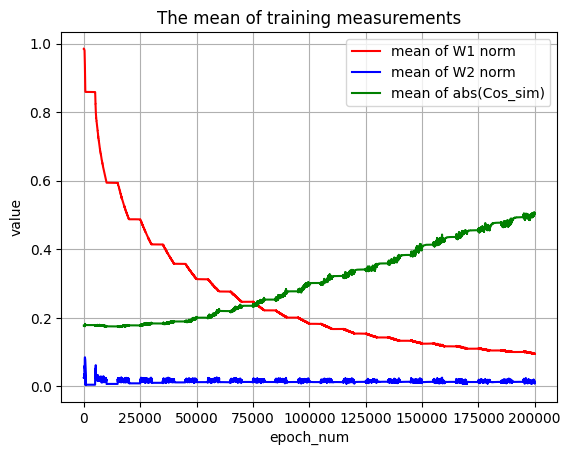

[0.02478337474167347, 0.024779055267572403, 0.0247690137475729, 0.024769261479377747, 0.02485080063343048, 0.024917256087064743, 0.02494094893336296, 0.024943359196186066, 0.024942202493548393, 0.0250776968896389, 0.025059055536985397, 0.025065762922167778, 0.025065749883651733, 0.02506674826145172, 0.025036120787262917, 0.025034692138433456, 0.02500610426068306, 0.024995096027851105, 0.025293640792369843, 0.025295211002230644, 0.025428172200918198, 0.025377720594406128, 0.02538381889462471, 0.0255824513733387, 0.02556435391306877, 0.025556521490216255, 0.025373727083206177, 0.025377139449119568, 0.025473734363913536, 0.02547619491815567, 0.025473207235336304, 0.025455642491579056, 0.025486065074801445, 0.02551652118563652, 0.025617655366659164, 0.025641117244958878, 0.02568667195737362, 0.02563629485666752, 0.025645051151514053, 0.02563912607729435, 0.02573198452591896, 0.025713438168168068, 0.02583298645913601, 0.02568734809756279, 0.025690540671348572, 0.025358974933624268, 0.025563

In [26]:
import matplotlib.pyplot as plt
W2_div_W1 = [W2_norm_means[i] / W1_norm_means[i] for i in range(epoch_num)]
plt.figure()  
start = 0
end = epoch_num
x = range(start, end)
plt.plot(x, W1_norm_means[start: end], label='mean of W1 norm', color='red')
plt.plot(x, W2_norm_means[start:end], label='mean of W2 norm', color='blue')
plt.plot(x, Cos_sim_abs_means[start:end], label='mean of abs(Cos_sim)', color='green')
plt.title('The mean of training measurements')
plt.xlabel('epoch_num')
plt.ylabel('value')
# plt.ylim(0,1)
plt.legend()
plt.grid(True)
plt.show() 

print(W2_norm_means[0:2000])
print(W1_norm_means[0])

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


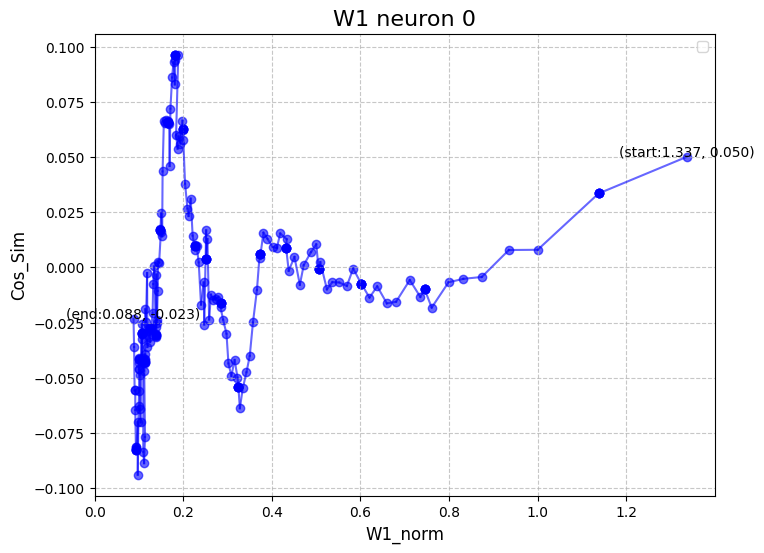

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


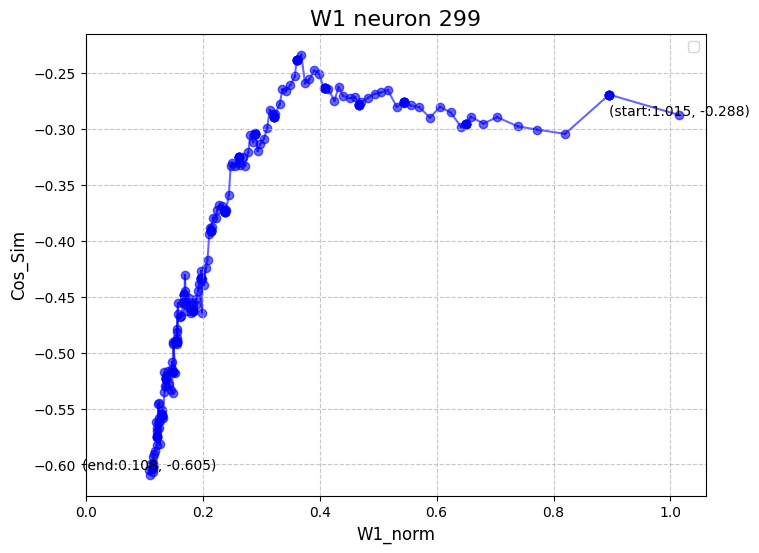

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


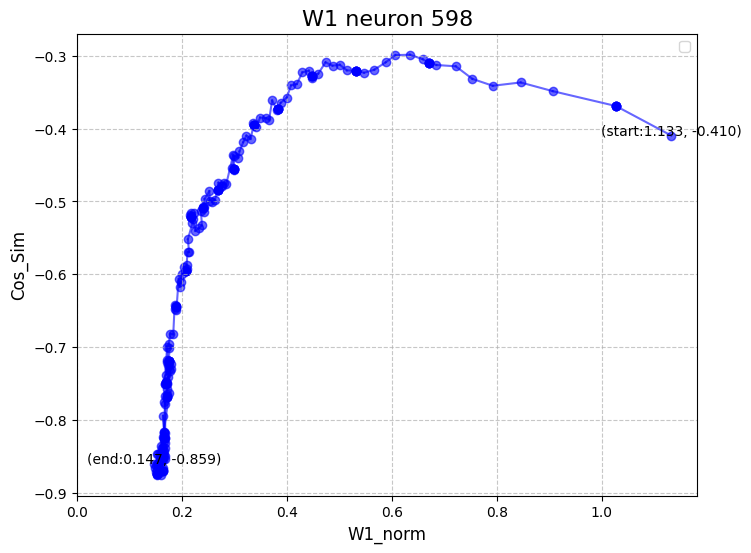

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


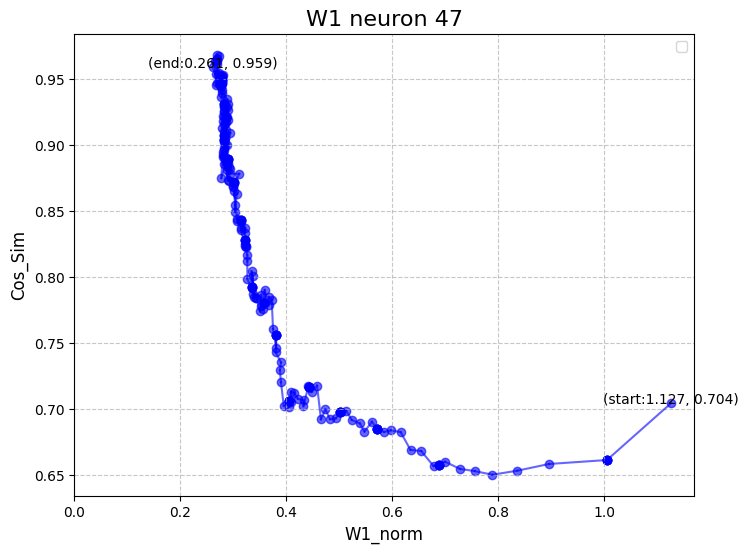

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


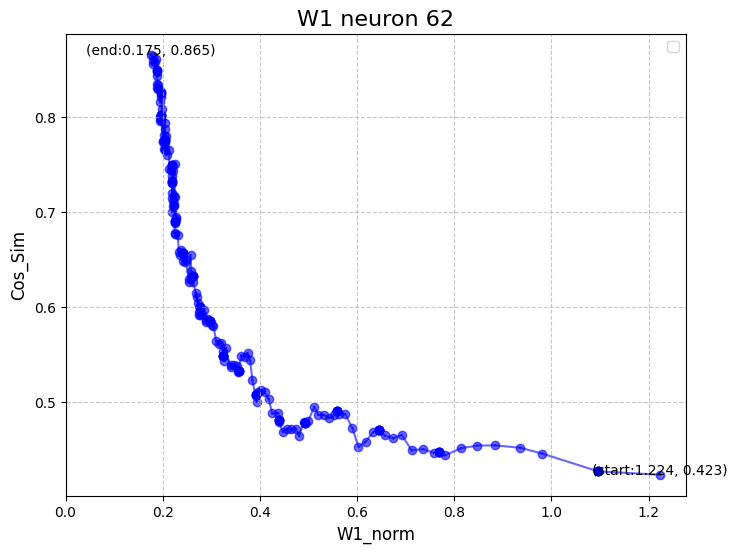

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


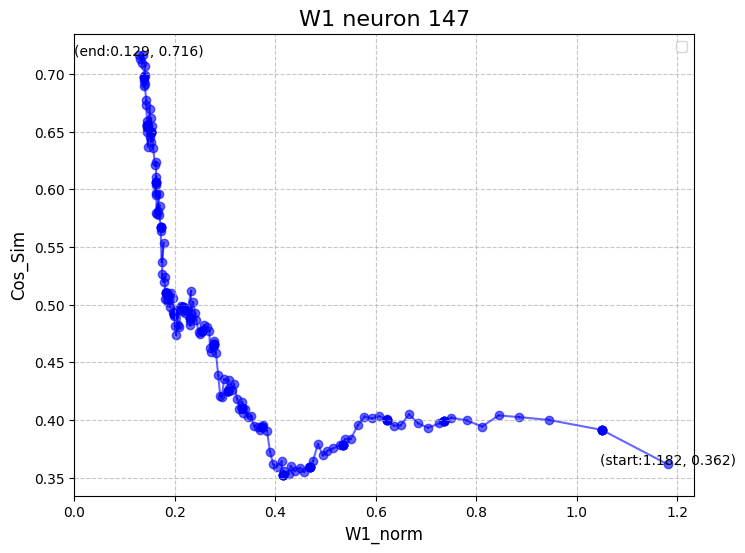

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


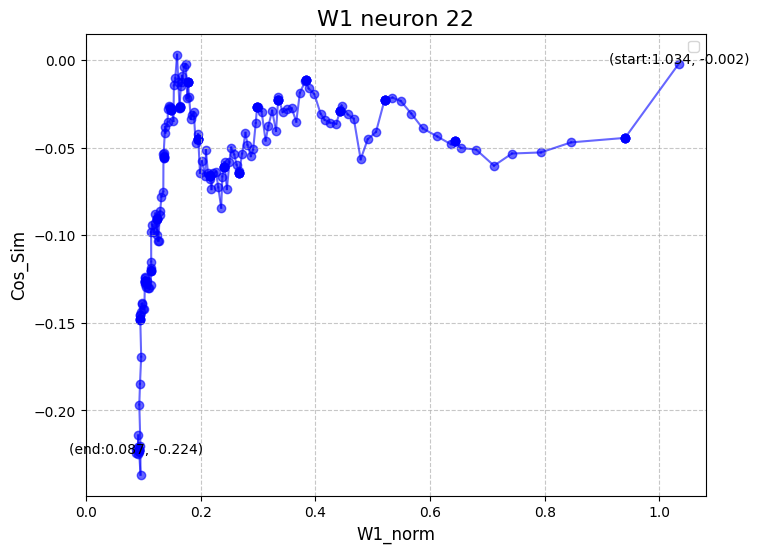

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


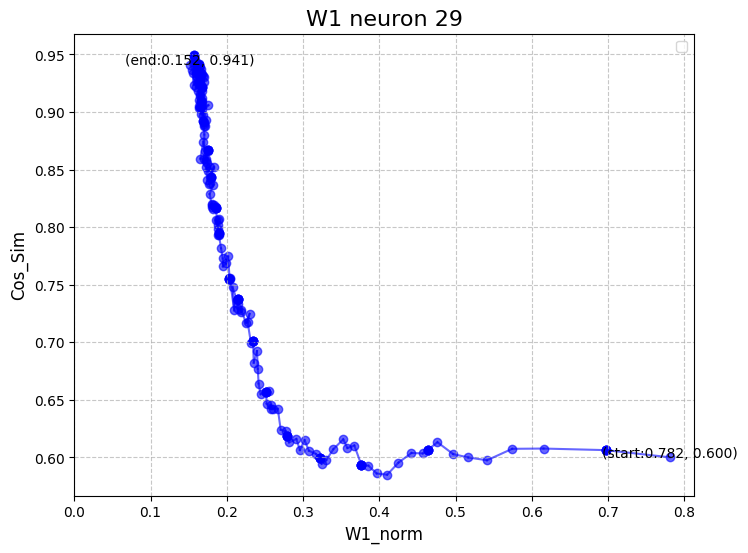

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


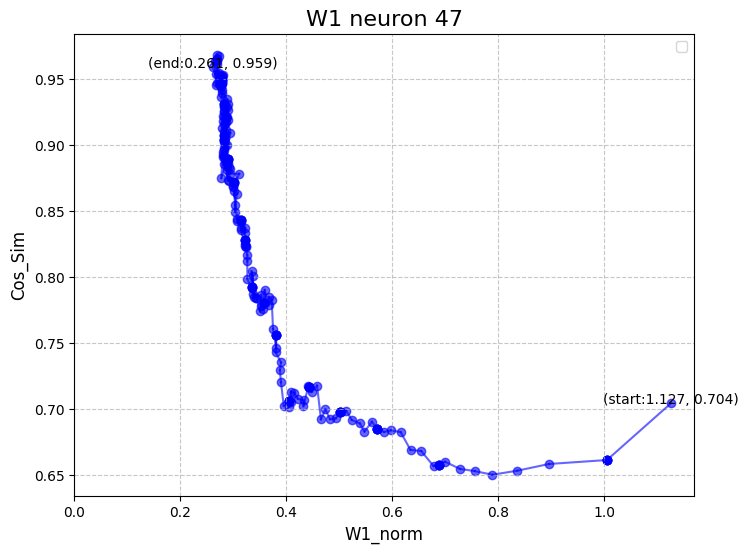

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


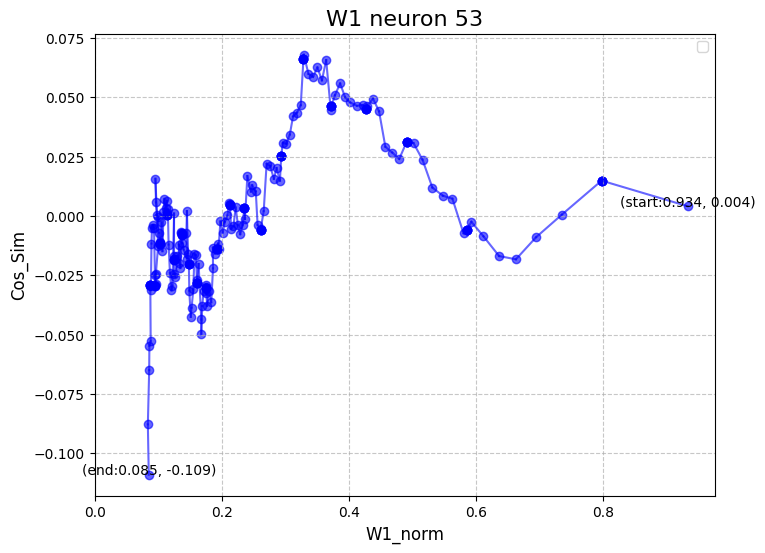

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


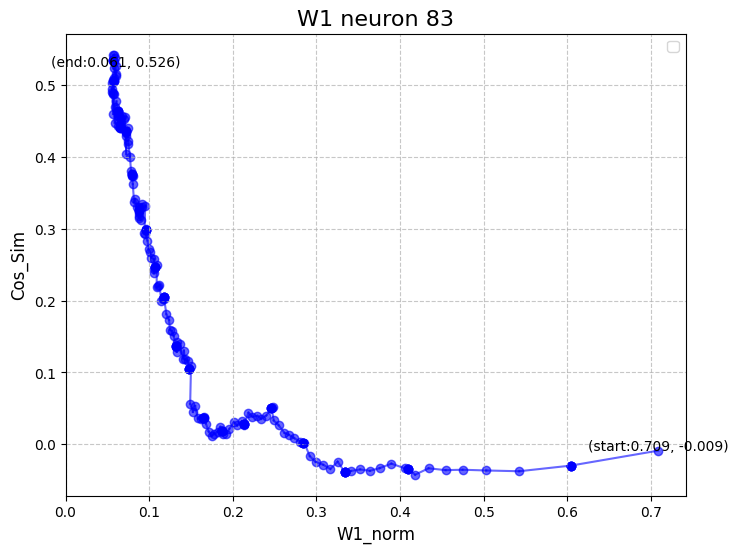

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


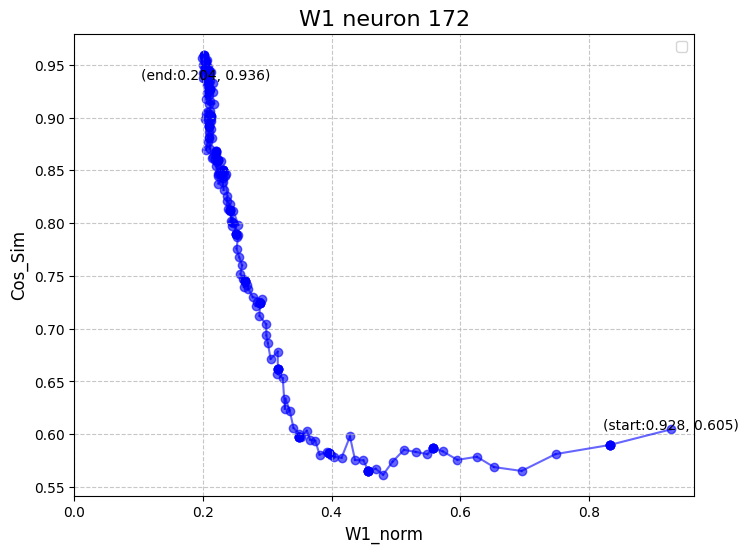

In [18]:
# norm and alignment corresponding to the neuron

for i in range(Spec_neuron_check_num):
     plt.figure(figsize=(8, 6))
     for j in range(1,check_num):
          plt.plot([W1_norm_list[j][W2_check_pos[i]],W1_norm_list[j - 1][W2_check_pos[i]]], [W1_cos_list[j][W2_check_pos[i]],W1_cos_list[j - 1][W2_check_pos[i]]],linestyle='-',  color='b', alpha=0.6)
     for j in range(check_num):
          plt.scatter(W1_norm_list[j][W2_check_pos[i]], W1_cos_list[j][W2_check_pos[i]], color='b', alpha=0.6)
     plt.annotate(f'(start:{W1_norm_list[0][W2_check_pos[i]]:.3f}, {W1_cos_list[0][W2_check_pos[i]]:.3f})',  
                 (W1_norm_list[0][W2_check_pos[i]], W1_cos_list[0][W2_check_pos[i]]),  
                 textcoords="offset points",     
                 xytext=(0, 0),        
                 ha='center',)   
     plt.annotate(f'(end:{W1_norm_list[check_num - 1][W2_check_pos[i]]:.3f}, {W1_cos_list[check_num - 1][W2_check_pos[i]]:.3f})',  
                 (W1_norm_list[check_num - 1][W2_check_pos[i]], W1_cos_list[check_num - 1][W2_check_pos[i]]),  
                 textcoords="offset points",     
                 xytext=(0, 0),        
                 ha='center',)  
     plt.title(f'W1 neuron {W2_check_pos[i]}', fontsize=16)
     plt.xlabel('W1_norm', fontsize=12)
     plt.ylabel('Cos_Sim', fontsize=12)

     plt.grid(True, linestyle='--', alpha=0.7)
     plt.xlim(0, )
     plt.legend()
     plt.show()

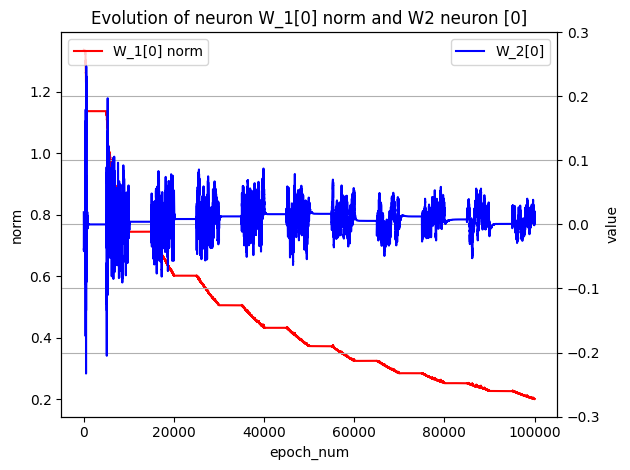

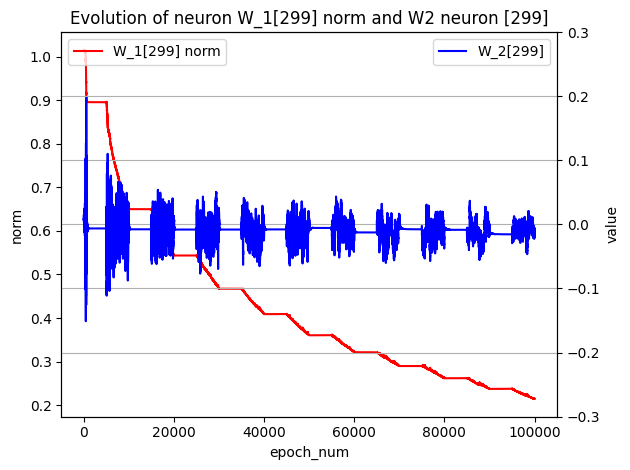

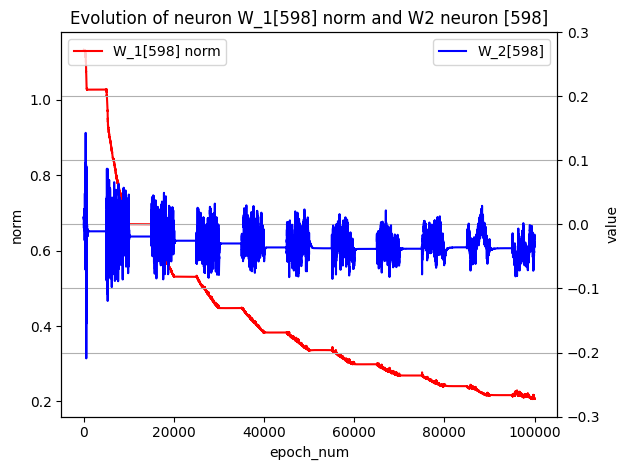

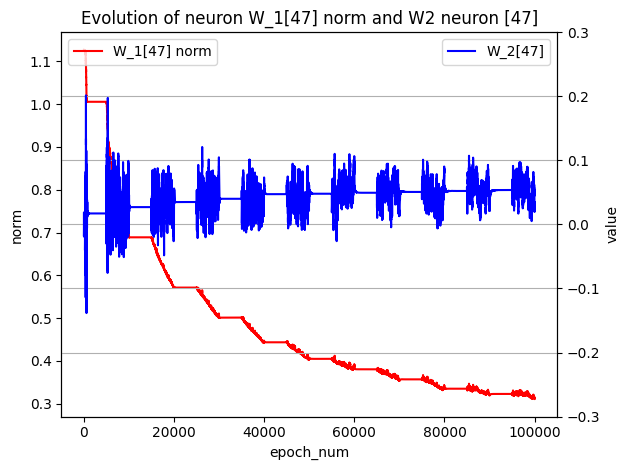

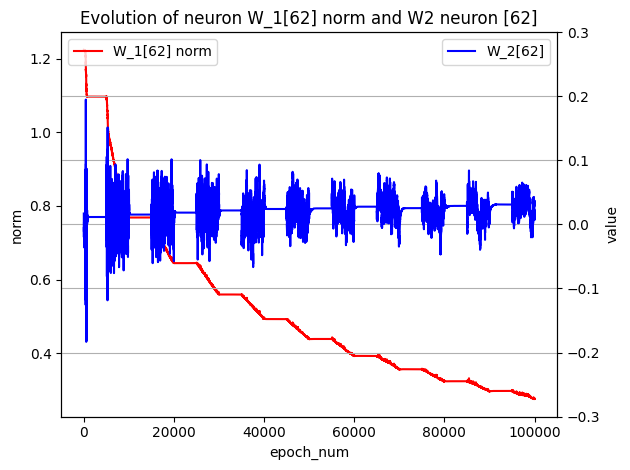

...

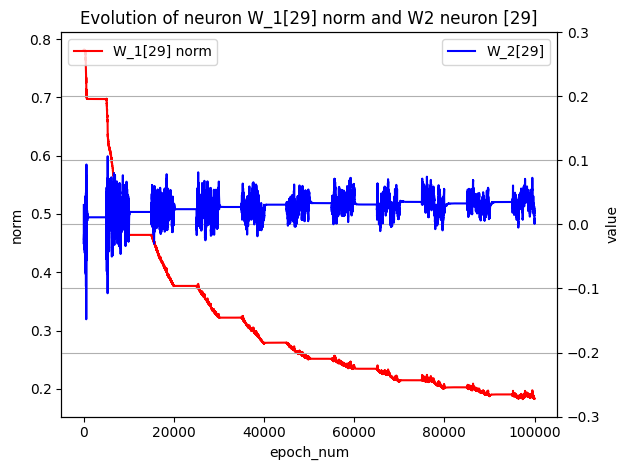

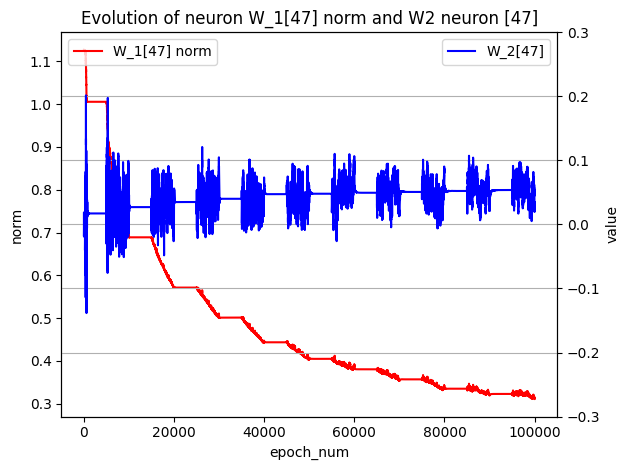

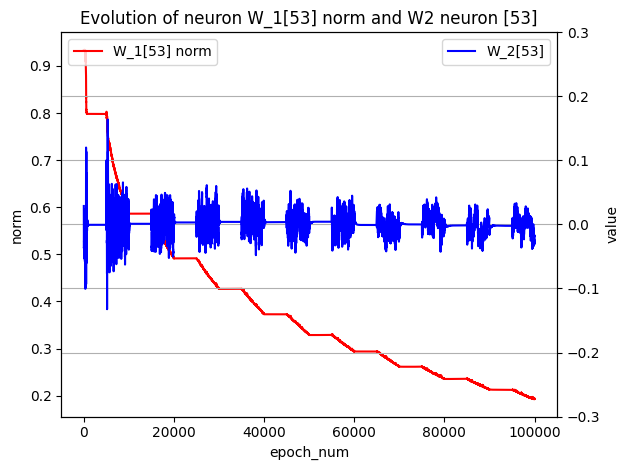

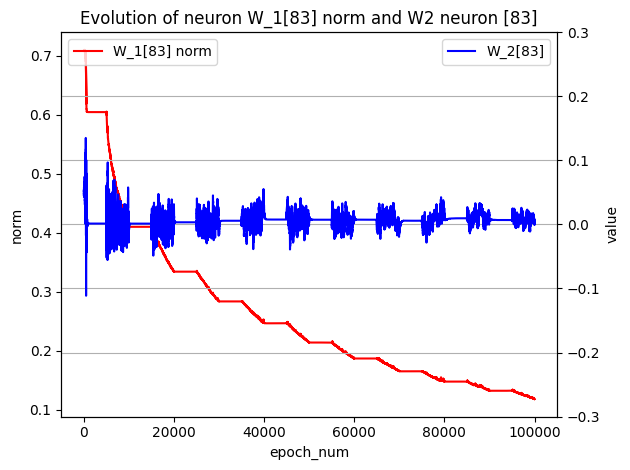

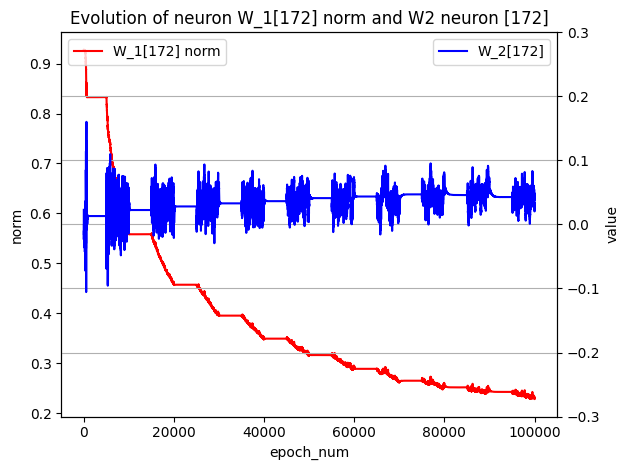

In [19]:
# Seperate norm corresponding to the neuron
test_start = 0
test_end = 100000
x = range(0, epoch_num + 1)
for i in range(Spec_neuron_check_num):
     fig, ax1 = plt.subplots()
     ax1.plot(x[test_start:test_end], W1_spec_norm[i][test_start:test_end], label=f'W_1[{W1_check_pos[i]}] norm', color='red')
     ax1.annotate(f'({x[epoch_num - 1]}, {W1_spec_norm[i][epoch_num - 1]:.3f})',  
                 (x[epoch_num - 1], W1_spec_norm[i][epoch_num - 1]),  
                 textcoords="offset points",     
                 xytext=(5, 5),        
                 ha='center',)   
     ax1.set_title(f'Evolution of neuron W_1[{W1_check_pos[i]}] norm and W2 neuron [{W2_check_pos[i]}]')
     ax1.set_xlabel('epoch_num')
     ax1.set_ylabel('norm')
     ax1.legend(loc="upper left")

   
     ax2 = ax1.twinx()
     ax2.plot(x[test_start:test_end], W2_check_list[i][test_start:test_end], label=f'W_2[{W2_check_pos[i]}]', color='blue')
     ax2.annotate(f'({x[epoch_num - 1]}, {W2_check_list[i][epoch_num - 1]:.3f})',  
                 (x[epoch_num - 1], W2_check_list[i][epoch_num - 1]),  
                 textcoords="offset points",     
                 xytext=(5, 5),        
                 ha='center',)   
     ax2.set_xlabel('epoch_num')
     ax2.set_ylabel('value')
     ax2.set_ylim(-0.3,0.3)

     ax2.legend(loc="upper right")
     ax2.grid(True)

     # for ax in (ax1, ax2):
     #      ax.axvline(x=1e-3, color='green', linestyle='--', linewidth=1)

     # plt.axhline(y=1e-3, color='green', linestyle='--')
     # plt.axhline(y=-1e-3, color='green', linestyle='--')

     fig.tight_layout() 
     plt.show()

In [20]:
for i in range(Spec_neuron_check_num):
     p = []
     for k in range(100):
          p.append(W1_spec_norm[i][k * 20])
     print(W1_check_pos[i], p)

0 [1.3369513750076294, 1.3369414806365967, 1.3367466926574707, 1.3364651203155518, 1.3363569974899292, 1.3361316919326782, 1.33575439453125, 1.3351932764053345, 1.3349335193634033, 1.3346415758132935, 1.334505319595337, 1.33356511592865, 1.3333226442337036, 1.3325124979019165, 1.3316514492034912, 1.3302379846572876, 1.3301233053207397, 1.3242876529693604, 1.3228458166122437, 1.319913387298584, 1.307154655456543, 1.3009240627288818, 1.2852500677108765, 1.2636232376098633, 1.2328344583511353, 1.201377511024475, 1.1875189542770386, 1.1858487129211426, 1.156266689300537, 1.1481000185012817, 1.1472153663635254, 1.142564296722412, 1.1409828662872314, 1.1389715671539307, 1.138342261314392, 1.1378467082977295, 1.1377466917037964, 1.137620449066162, 1.1376707553863525, 1.1375173330307007, 1.1375033855438232, 1.137487769126892, 1.137479543685913, 1.1374784708023071, 1.1374778747558594, 1.1374766826629639, 1.1374740600585938, 1.1374722719192505, 1.1374719142913818, 1.137471318244934, 1.1374711990

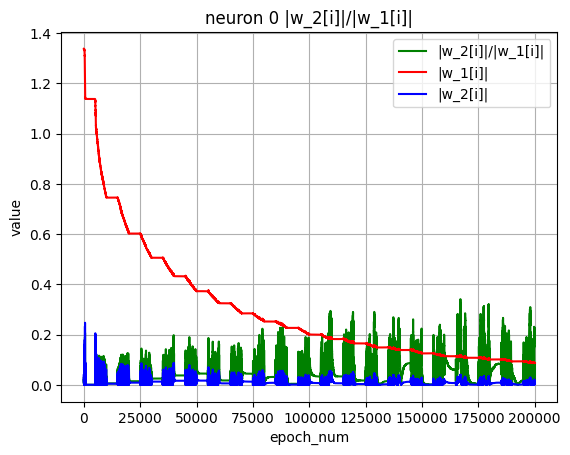

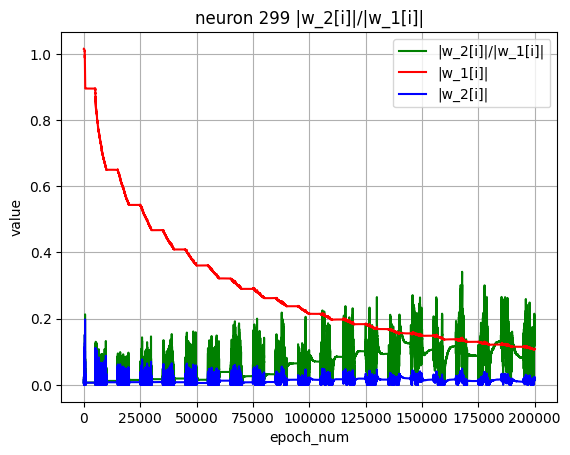

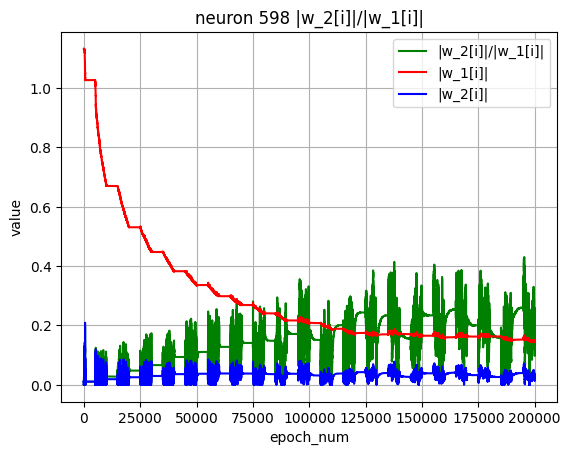

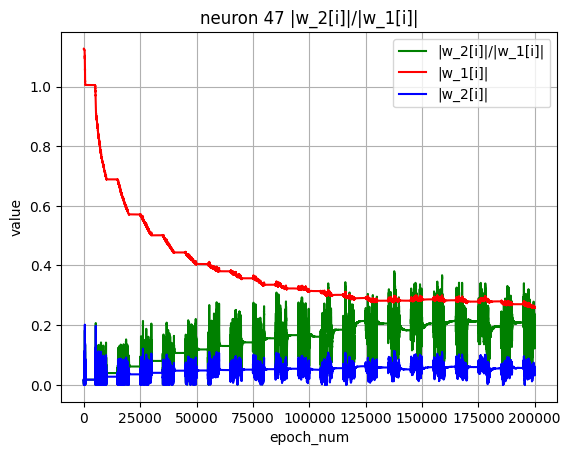

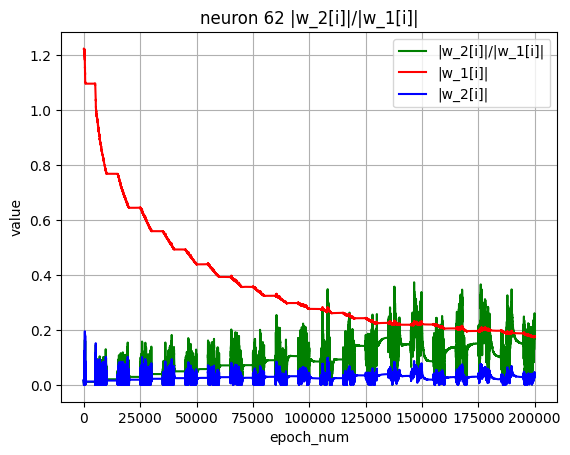

...

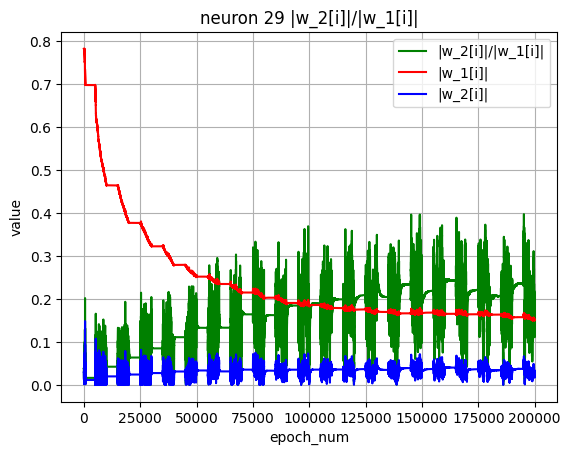

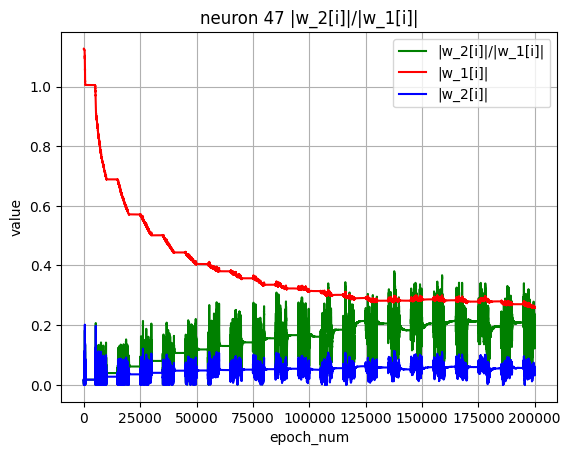

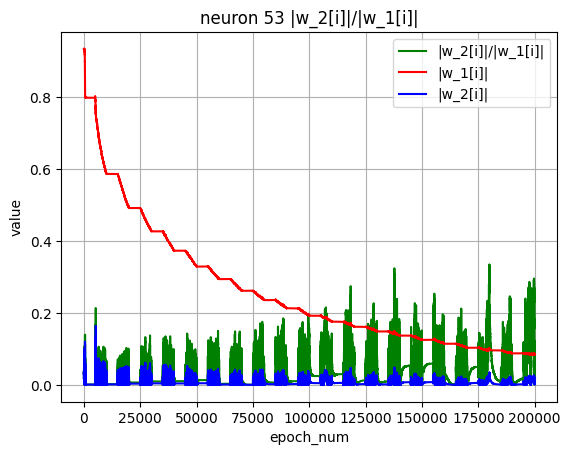

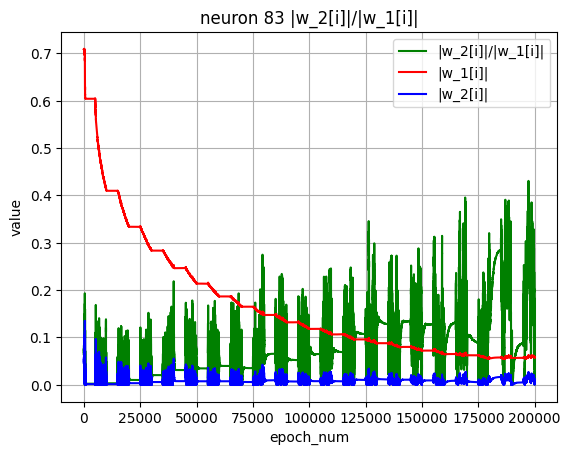

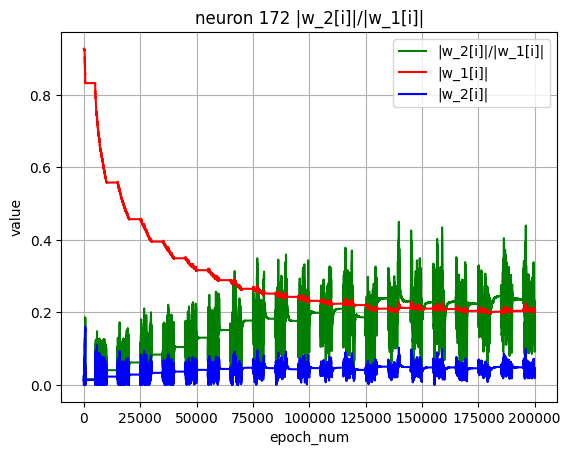

In [21]:
# check |w_2[i]|/|w_1[i]|
test_start = 0
test_end = epoch_num - 1
for i in range(Spec_neuron_check_num):
     plt.figure()
     x = range(test_start, test_end)
     ratio = [abs(W2_check_list[i][j] / W1_spec_norm[i][j]) for j in range(epoch_num)]
     W2_check_list_abs= [abs(W2_check_list[i][j]) for j in range(epoch_num)]
     plt.plot(x, ratio[test_start:test_end], label='|w_2[i]|/|w_1[i]|', color='green')
     plt.plot(x, W1_spec_norm[i][test_start:test_end], label='|w_1[i]|', color='red')
     plt.plot(x, W2_check_list_abs[test_start:test_end], label='|w_2[i]|', color='blue')
     plt.title(f'neuron {W1_check_pos[i]} |w_2[i]|/|w_1[i]|')
     plt.xlabel('epoch_num')
     plt.ylabel('value')
     plt.legend()
     
     plt.grid(True)

     plt.show() 

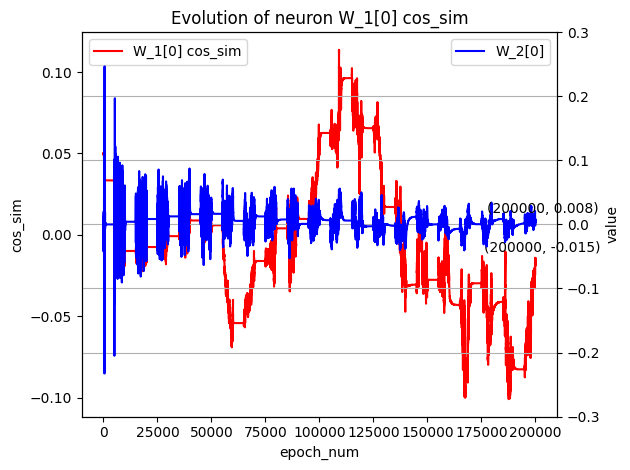

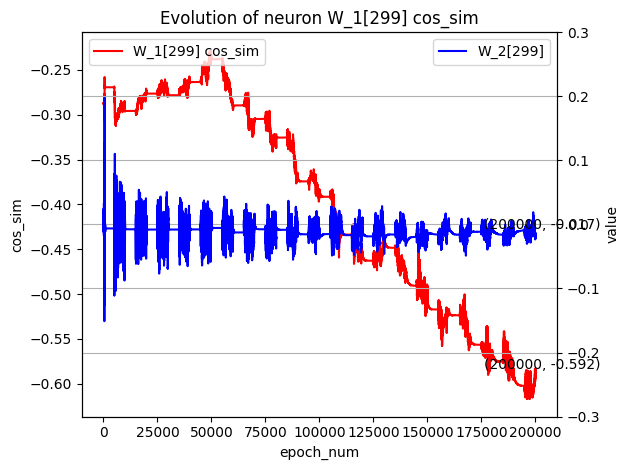

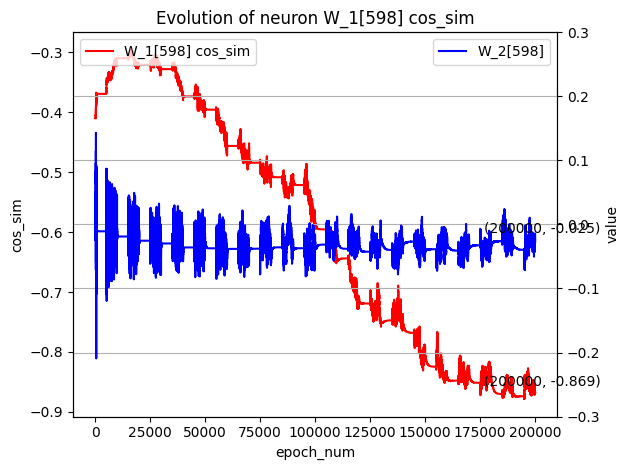

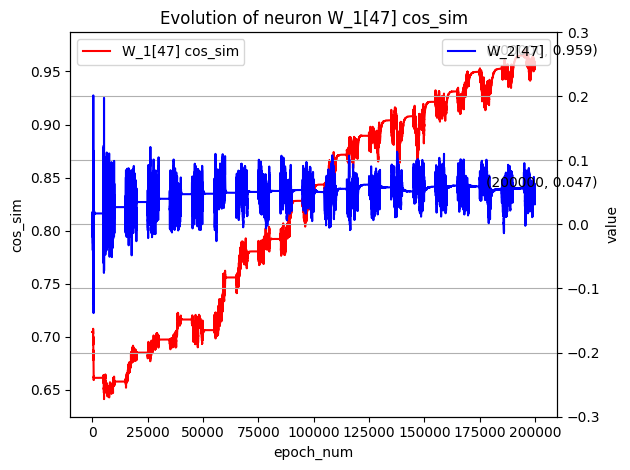

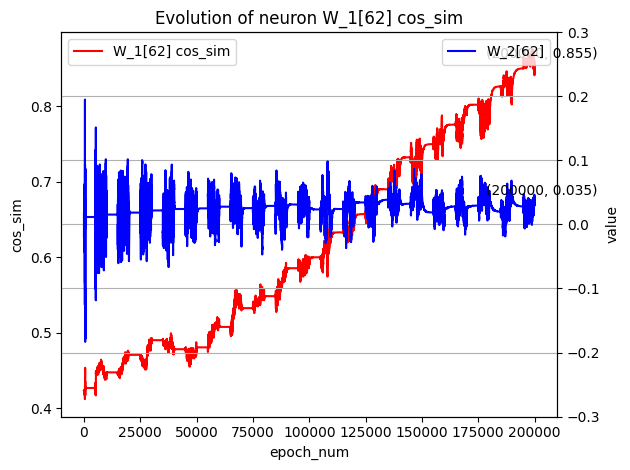

...

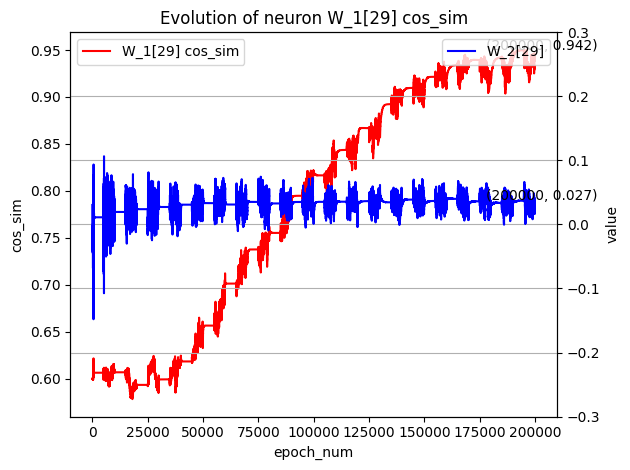

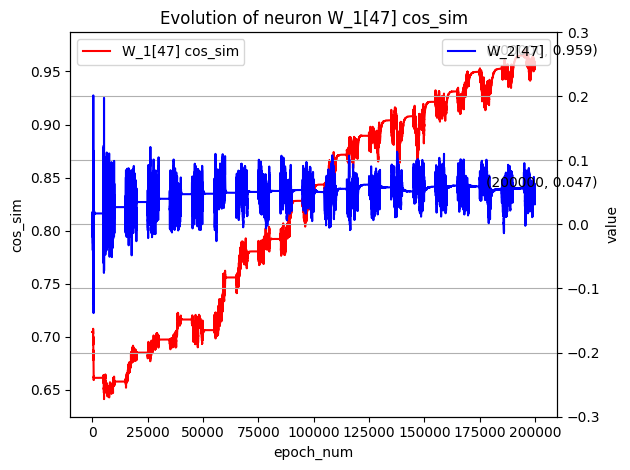

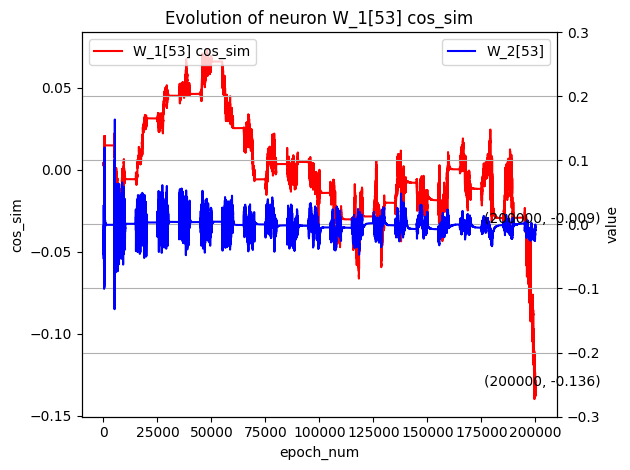

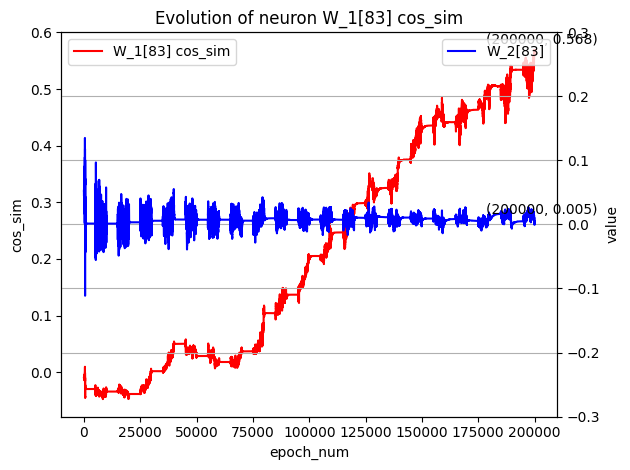

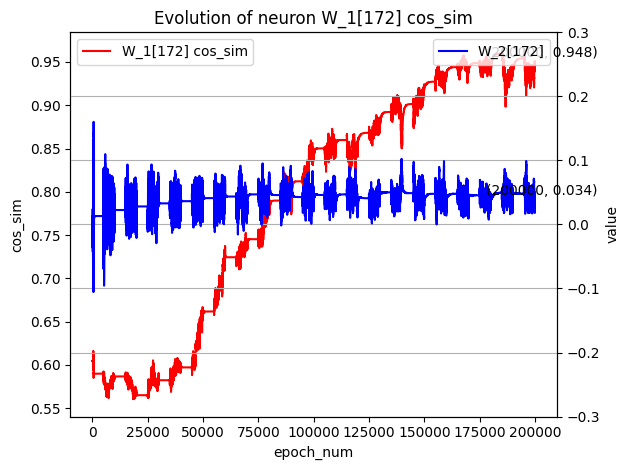

In [22]:
# Cos_sim corresponding to the neuron

x = range(0, epoch_num + 1)
for i in range(Spec_neuron_check_num):
     fig, ax1 = plt.subplots()
     ax1.plot(x, W1_spec_cossim[i], label=f'W_1[{W1_check_pos[i]}] cos_sim', color='red')
     ax1.annotate(f'({x[epoch_num - 1]}, {W1_spec_cossim[i][epoch_num - 1]:.3f})',  
                 (x[epoch_num - 1], W1_spec_cossim[i][epoch_num - 1]),  
                 textcoords="offset points",     
                 xytext=(5, 5),        
                 ha='center',)   
     ax1.set_title(f'Evolution of neuron W_1[{W1_check_pos[i]}] cos_sim')
     ax1.set_xlabel('epoch_num')
     ax1.set_ylabel('cos_sim')
     ax1.legend(loc="upper left")


     ax2 = ax1.twinx()
     ax2.plot(x, W2_check_list[i], label=f'W_2[{W2_check_pos[i]}]', color='blue')
     ax2.annotate(f'({x[epoch_num - 1]}, {W2_check_list[i][epoch_num - 1]:.3f})',  
                 (x[epoch_num - 1], W2_check_list[i][epoch_num - 1]),  
                 textcoords="offset points",     
                 xytext=(5, 5),        
                 ha='center',)   
     ax2.set_xlabel('epoch_num')
     ax2.set_ylabel('value')
     ax2.set_ylim(-0.3,0.3)
     ax2.legend(loc="upper right")
     ax2.grid(True)

     fig.tight_layout() 
     plt.show() 

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


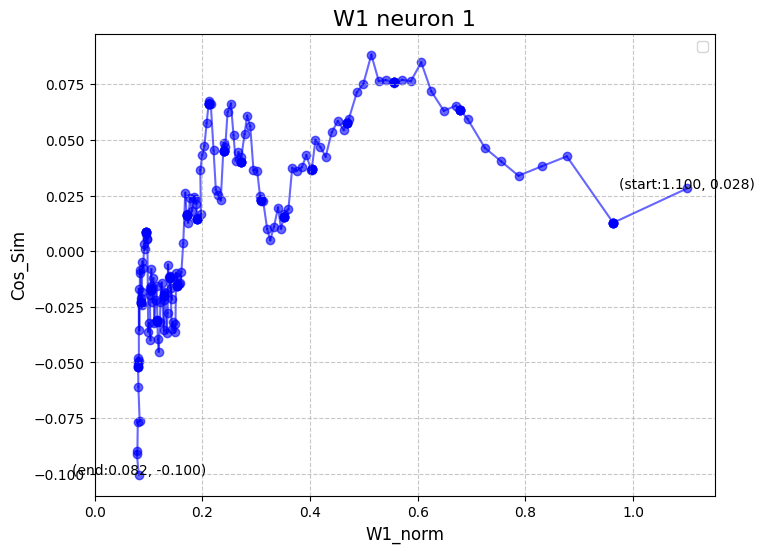

In [23]:
# norm and alignment corresponding to certain neuron
valid_point = 1
plt.figure(figsize=(8, 6))
for j in range(1,check_num):
     plt.plot([W1_norm_list[j][valid_point],W1_norm_list[j - 1][valid_point]], [W1_cos_list[j][valid_point],W1_cos_list[j - 1][valid_point]],linestyle='-',  color='b', alpha=0.6)
for j in range(check_num):
     plt.scatter(W1_norm_list[j][valid_point], W1_cos_list[j][valid_point], color='b', alpha=0.6)
plt.annotate(f'(start:{W1_norm_list[0][valid_point]:.3f}, {W1_cos_list[0][valid_point]:.3f})',  
               (W1_norm_list[0][valid_point], W1_cos_list[0][valid_point]),  
               textcoords="offset points",     
               xytext=(0, 0),        
               ha='center',)   
plt.annotate(f'(end:{W1_norm_list[check_num - 1][valid_point]:.3f}, {W1_cos_list[check_num - 1][valid_point]:.3f})',  
               (W1_norm_list[check_num - 1][valid_point], W1_cos_list[check_num - 1][valid_point]),  
               textcoords="offset points",     
               xytext=(0, 0),        
               ha='center',)  
plt.title(f'W1 neuron {valid_point}', fontsize=16)
plt.xlabel('W1_norm', fontsize=12)
plt.ylabel('Cos_Sim', fontsize=12)

plt.grid(True, linestyle='--', alpha=0.7)
plt.xlim(0, )
plt.legend()
plt.show()

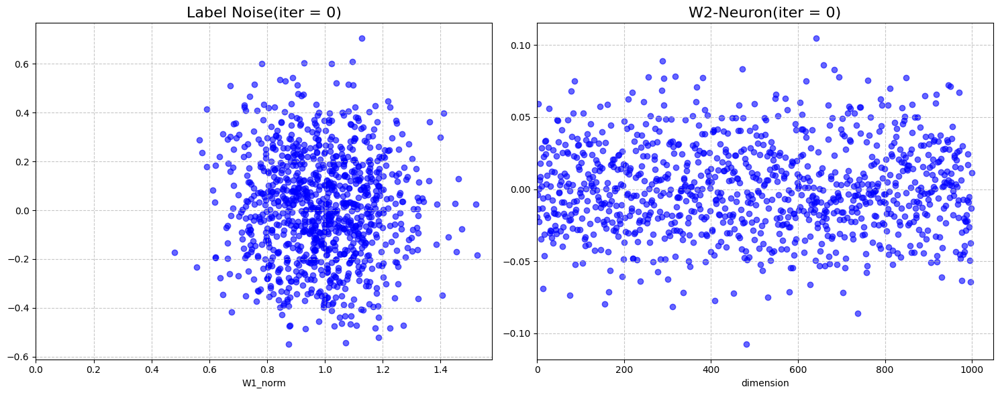

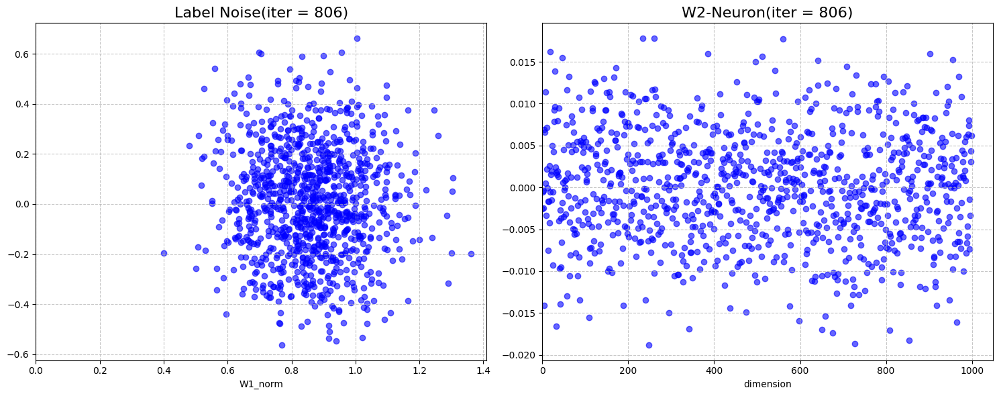

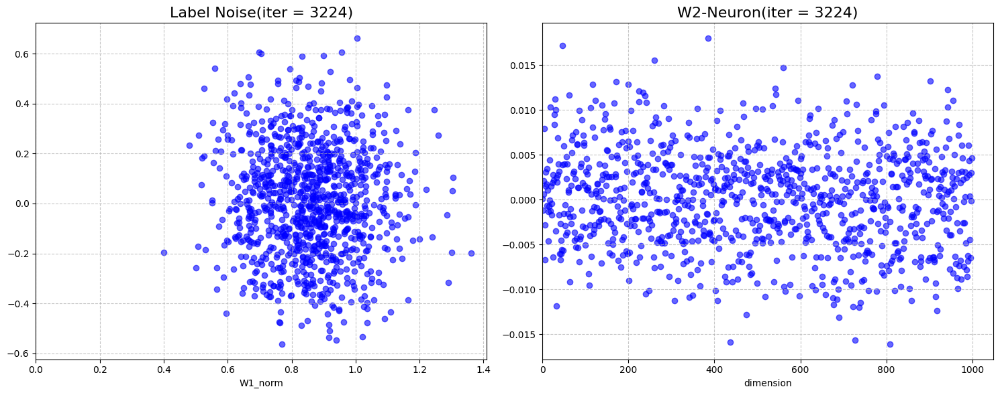

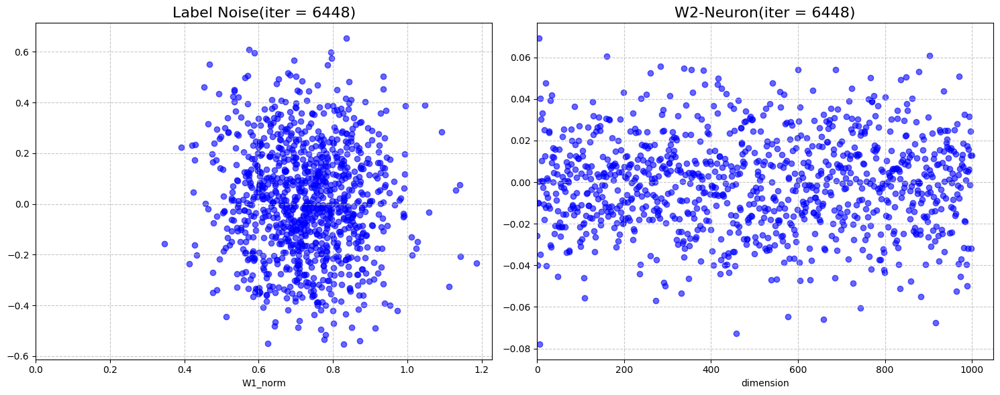

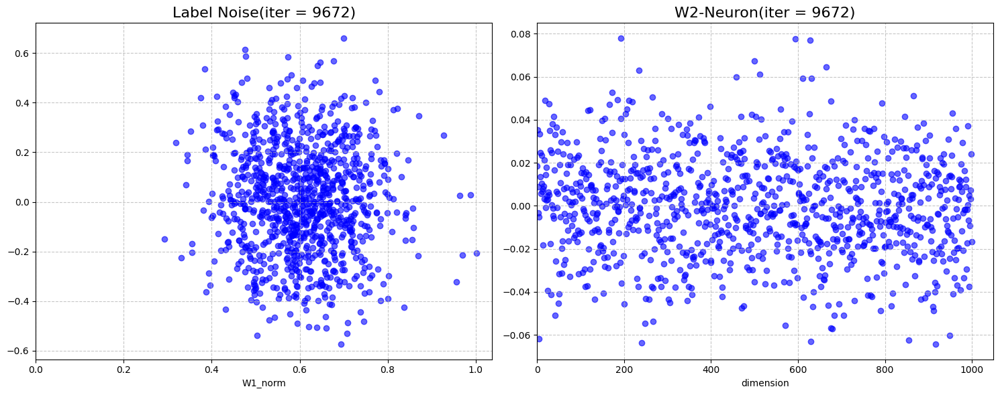

...

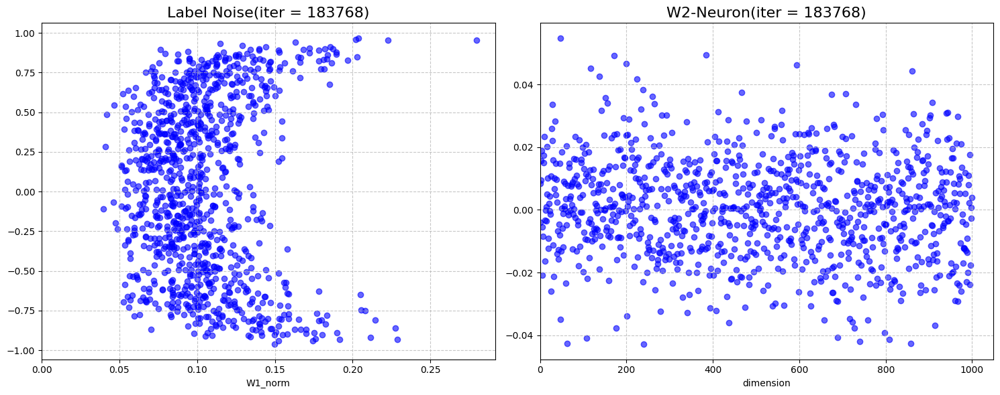

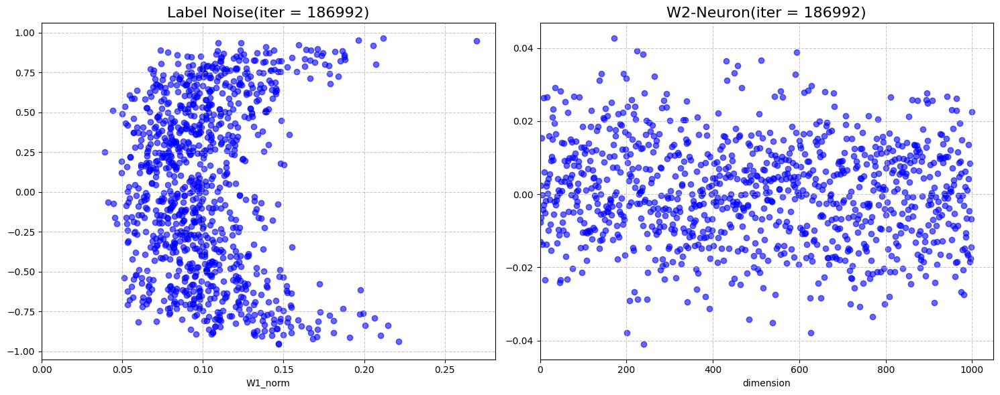

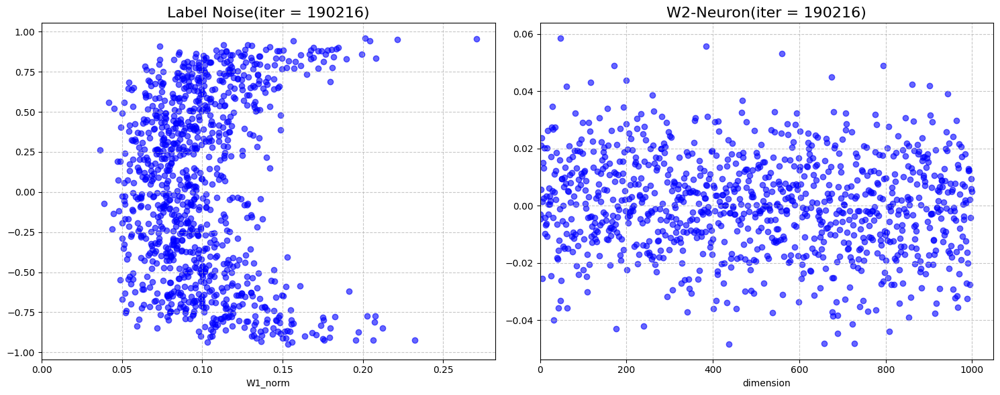

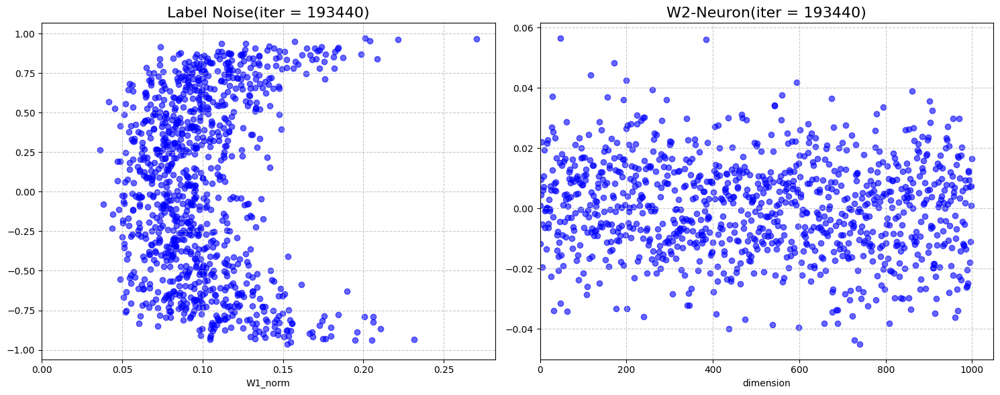

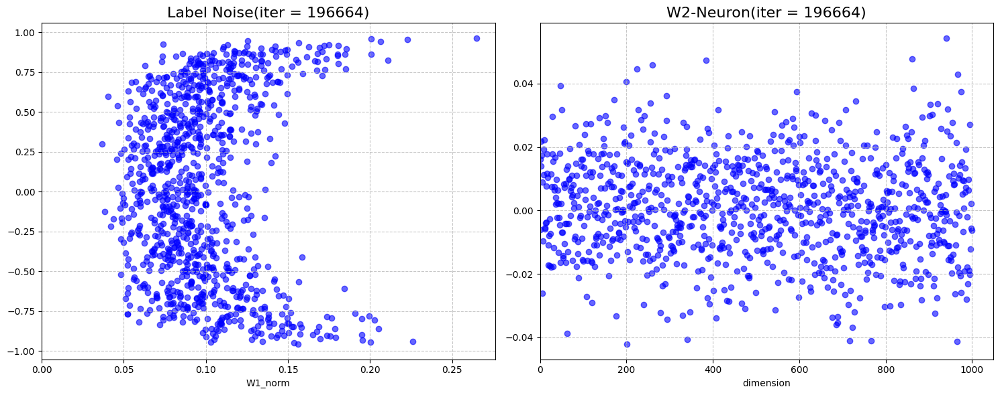

In [25]:
# # compare norm alignment with W2
for i in range(check_num):
     if i % 4 != 0 and i != 1:
          continue
     fig, axes = plt.subplots(1, 2, figsize = (15,6))  # 1行2列的子图
     axes[0].scatter(W1_norm_list[i], W1_cos_list[i], color='b', alpha=0.6)
     axes[0].set_title(f'Label Noise(iter = {check_pos[i]})',fontsize=16)
     axes[0].grid(True, linestyle='--', alpha=0.7)
     axes[0].set_xlim(left=0)
     axes[0].set_xlabel("W1_norm")

     axes[1].scatter(W2_x, W2_list[i], color='b', alpha=0.6)
     axes[1].set_title(f'W2-Neuron(iter = {check_pos[i]})', fontsize=16)
     axes[1].grid(True, linestyle='--', alpha=0.7)
     axes[1].set_xlim(left=0)
     axes[1].set_xlabel("dimension")

     plt.tight_layout()
     plt.show()